# Exloring World Bank API's

In [54]:
# !pip install numerize 

In [1]:
import os 
import wbgapi as wb
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt
import re

from numerize import numerize

In [2]:
DATAPATH='../assets'
EDA='eda'

In [3]:
FILENAME='wb_concatenated_series.csv'
df_data=pd.read_csv(os.path.join(DATAPATH,EDA,FILENAME))
df_data=df_data.drop(['Unnamed: 0'],axis=1)
print(df_data.shape)
df_data.head()

(39368, 67)


,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,ZWE,SL.UEM.TOTL.NE.ZS,Zimbabwe,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4.774,NaN,NaN,NaN,NaN,7.373,NaN,9.540,10.087
1,ZMB,SL.UEM.TOTL.NE.ZS,Zambia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,11.888,NaN,8.518,5.031,5.539,6.032,5.195,5.993
2,YEM,SL.UEM.TOTL.NE.ZS,"Yemen, Rep.","Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,13.467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PSE,SL.UEM.TOTL.NE.ZS,West Bank and Gaza,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,19.894,20.527,23.005,23.939,25.677,26.256,25.340,25.895,26.390,24.420
4,VIR,SL.UEM.TOTL.NE.ZS,Virgin Islands (U.S.),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
FILENAME='wb_addition_series.csv'
df_data2=pd.read_csv(os.path.join(DATAPATH,FILENAME))
print(df_data2.shape)
df_data2.head()

(20748, 67)


,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,ZWE,EN.POP.SLUM.UR.ZS,Zimbabwe,Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,23.35427,NaN,22.75892,NaN,22.16356,NaN,21.56821,NaN,NaN
1,ZMB,EN.POP.SLUM.UR.ZS,Zambia,Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,52.91605,NaN,51.36341,NaN,49.81077,NaN,48.25813,NaN,NaN
2,YEM,EN.POP.SLUM.UR.ZS,"Yemen, Rep.",Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,45.46147,NaN,44.20000,NaN,44.20000,NaN,NaN,NaN,NaN
3,PSE,EN.POP.SLUM.UR.ZS,West Bank and Gaza,Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,21.44433,NaN,19.53763,NaN,19.50000,NaN,19.50000,NaN,NaN
4,VIR,EN.POP.SLUM.UR.ZS,Virgin Islands (U.S.),Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
FILENAME='regions.csv'
df_regions=pd.read_csv(os.path.join(DATAPATH,EDA,FILENAME))
print(df_regions.shape)
df_regions.head()

(44, 4)


,code,name,members,member_count
0,AFE,Africa Eastern and Southern,"ETH,BDI,SOM,COM,ZWE,NAM,SWZ,KEN,COD,MUS,MWI,BW...",26
1,AFR,Africa,"ETH,GIN,LBR,GAB,MLI,LBY,GHA,BDI,CMR,GNQ,NGA,SO...",54
2,AFW,Africa Western and Central,"GIN,LBR,GAB,MLI,GHA,CMR,NGA,GNQ,MRT,CAF,BEN,BF...",22
3,ARB,Arab World,"PSE,OMN,LBY,SOM,COM,MRT,JOR,SAU,SYR,TUN,QAT,DJ...",22
4,CAA,Sub-Saharan Africa (IFC classification),"ETH,GIN,LBR,GAB,MLI,GHA,BDI,CMR,GNQ,NGA,SOM,CO...",49


In [6]:
FILENAME='WDIEXCEL.xlsx'
df_codes=pd.read_excel(os.path.join(DATAPATH,FILENAME),engine='openpyxl',sheet_name='Series')
print(df_codes.shape)
df_codes

(1492, 20)


,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type
0,AG.AGR.TRAC.NO,Environment: Agricultural production,"Agricultural machinery, tractors",NaN,Agricultural machinery refers to the number of...,NaN,Annual,NaN,NaN,Sum,The data are collected by the Food and Agricul...,NaN,NaN,"Food and Agriculture Organization, electronic ...",A tractor provides the power and traction to m...,Agricultural land covers more than one-third o...,NaN,NaN,NaN,CC BY-4.0
1,AG.CON.FERT.PT.ZS,Environment: Agricultural production,Fertilizer consumption (% of fertilizer produc...,NaN,Fertilizer consumption measures the quantity o...,NaN,Annual,NaN,The world and regional aggregate series do not...,Weighted average,The FAO has revised the time series for fertil...,NaN,NaN,"Food and Agriculture Organization, electronic ...",Fertilizer consumption measures the quantity o...,"Factors such as the green revolution, has led ...",NaN,NaN,NaN,CC BY-4.0
2,AG.CON.FERT.ZS,Environment: Agricultural production,Fertilizer consumption (kilograms per hectare ...,NaN,Fertilizer consumption measures the quantity o...,NaN,Annual,NaN,The world and regional aggregate series do not...,Weighted average,The FAO has revised the time series for fertil...,NaN,NaN,"Food and Agriculture Organization, electronic ...",Fertilizer consumption measures the quantity o...,"Factors such as the green revolution, has led ...",NaN,NaN,NaN,CC BY-4.0
3,AG.LND.AGRI.K2,Environment: Land use,Agricultural land (sq. km),NaN,Agricultural land refers to the share of land ...,NaN,Annual,NaN,Areas of former states are included in the suc...,Sum,The data are collected by the Food and Agricul...,NaN,NaN,"Food and Agriculture Organization, electronic ...",Agricultural land constitutes only a part of a...,Agricultural land covers more than one-third o...,NaN,NaN,NaN,CC BY-4.0
4,AG.LND.AGRI.ZS,Environment: Land use,Agricultural land (% of land area),NaN,Agricultural land refers to the share of land ...,NaN,Annual,NaN,Areas of former states are included in the suc...,Weighted average,The data are collected by the Food and Agricul...,NaN,NaN,"Food and Agriculture Organization, electronic ...",Agriculture is still a major sector in many ec...,Agricultural land covers more than one-third o...,NaN,NaN,NaN,CC BY-4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1487,VC.IDP.NWDS,Public Sector: Conflict & fragility,"Internally displaced persons, new displacement...",NaN,Internally displaced persons are defined accor...,NaN,Annual,NaN,NaN,Sum,Please note that most of the figures are estim...,NaN,NaN,The Internal Displacement Monitoring Centre (h...,"Internally displaced persons are ""persons or g...",Although all persons affected by conflict and/...,NaN,NaN,NaN,CC BY-4.0
1488,VC.IDP.TOCV,Public Sector: Conflict & fragility,"Internally displaced persons, total displaced ...",NaN,Internally displaced persons are defined accor...,NaN,Annual,NaN,NaN,Sum,Please note that most of the figures are estim...,NaN,NaN,The Internal Displacement Monitoring Centre (h...,"Internally displaced persons are ""persons or g...",Although all persons affected by conflict and/...,NaN,NaN,NaN,CC BY-4.0
1489,VC.IHR.PSRC.FE.P5,Public Sector: Conflict & fragility,"Intentional homicides, female (per 100,000 fem...",NaN,"Intentional homicides, female are estimates of...",NaN,Annual,NaN,NaN,NaN,Statistics reported to the United Nations in t...,NaN,NaN,UN Office on Drugs and Crime's International H...,The definitions used to produce data are in li...,"In some regions, organized crime, drug traffic...",NaN,NaN,NaN,CC BY-4.0
1490,VC.IHR.PSRC.MA.P5,Public Sector: Conflict & fragility,"Intentional homicides, male (per 100,000 male)",N

In [33]:
df_codes['Topic'].unique()

array(['Environment: Agricultural production', 'Environment: Land use',
       'Economic Policy & Debt: Balance of payments: Current account: Goods, services & income',
       'Economic Policy & Debt: Balance of payments: Capital & financial account',
       'Economic Policy & Debt: Balance of payments: Current account: Transfers',
       'Economic Policy & Debt: Balance of payments: Current account: Balances',
       'Economic Policy & Debt: Balance of payments: Reserves & other items',
       'Infrastructure: Communications',
       'Public Sector: Policy & institutions',
       'Financial Sector: Capital markets',
       'Economic Policy & Debt: Official development assistance',
       'Economic Policy & Debt: External debt: Debt outstanding',
       'Economic Policy & Debt: External debt: Debt ratios & other items',
       'Economic Policy & Debt: External debt: Net flows',
       'Economic Policy & Debt: External debt: Debt service',
       'Environment: Energy production & use', 

In [34]:
df_codes['Series Code'].nunique()

1492

In [35]:
df_codes.isna().sum()

Series Code                               0
Topic                                     0
Indicator Name                            0
Short definition                       1291
Long definition                           0
Unit of measure                        1437
Periodicity                              24
Base Period                            1416
Other notes                            1435
Aggregation method                      440
Limitations and exceptions              621
Notes from original source             1374
General comments                       1116
Source                                    0
Statistical concept and methodology     538
Development relevance                   734
Related source links                   1434
Other web links                        1475
Related indicators                     1483
License Type                             12
dtype: int64

In [36]:
df_codes['Periodicity'].unique()

array(['Annual', nan, 'Triennial', 'Biennial', 'Every two years',
       'Quarterly (represented as Annual)'], dtype=object)

In [37]:
df_codes['Aggregation method'].unique()

array(['Sum', 'Weighted average', nan, 'Gap-filled total', 'Median',
       'Unweighted average', 'Linear mixed-effect model estimates',
       'See SH.STA.OWGH.ME.ZS for aggregation',
       'See SH.STA.STNT.ME.ZS for aggregation'], dtype=object)

In [58]:
regions=df_regions.name.tolist()
regions

['Africa Eastern and Southern',
 'Africa',
 'Africa Western and Central',
 'Arab World',
 'Sub-Saharan Africa (IFC classification)',
 'East Asia and the Pacific (IFC classification)',
 'Central Europe and the Baltics',
 'Europe and Central Asia (IFC classification)',
 'Latin America and the Caribbean (IFC classification)',
 'Middle East and North Africa (IFC classification)',
 'South Asia (IFC classification)',
 'Caribbean small states',
 'East Asia & Pacific (excluding high income)',
 'Early-demographic dividend',
 'East Asia & Pacific',
 'Europe & Central Asia (excluding high income)',
 'Europe & Central Asia',
 'Euro area',
 'European Union',
 'Fragile and conflict affected situations',
 'Heavily indebted poor countries (HIPC)',
 'Latin America & Caribbean (excluding high income)',
 'Latin America & Caribbean ',
 'Least developed countries: UN classification',
 'Late-demographic dividend',
 'Middle East (developing only)',
 'Middle East & North Africa',
 'Middle East & North Africa 

# WBG API

WBGAPI includes sub-packages for major features in the World Bank API:

 Feature	   Description
- series:	   Indicators (e.g., 'SP.POP.TOTL')
- economy:	   Countries and economies (could be subnational for some databases)
- time:	       Time (usually annual, sometimes quarterly or monthly)
- source:	   Databases (e.g., WDI, Doing Business, International Debt)
- region:	   World Bank regions (this is global to all databases)
- income:	   World Bank income groups (also global)
- lending:	   World Bank lending types (also global)
- topic:	       World Bank topics (this is also a global list and discrete from the Topic metadata field for series)

Each of the above implements a minimum of four functions for accessing and displaying elements of that feature:

    Function:	Description
- list:	Returns an iterable list (python generator) of elements
- get:	Returns a single element, e.g. get('SP.POP.TOTL')
- info:	Like list but returns a human-readable table
- Series:	Like list but returns a pandas Series

In [8]:
dir(wb)

['APIError',
 'APIResponseError',
 'Coder',
 'Featureset',
 'Metadata',
 'MetadataCollection',
 'Series',
 'URLError',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_concept_mrv_cache',
 '_queryAPI',
 '_refetch_url',
 '_responseHeader',
 '_responseObjects',
 'abbreviate',
 'api_maxlen',
 'data',
 'db',
 'economy',
 'economy_coder',
 'economy_metadata',
 'endpoint',
 'fetch',
 'get',
 'get_options',
 'htmlTable',
 'income',
 'lang',
 'lending',
 'metadata',
 'pd',
 'per_page',
 'proxies',
 'queryParam',
 're',
 'reduce',
 'refetch',
 'region',
 'requests',
 'search',
 'search2',
 'series',
 'series_metadata',
 'source',
 'tabulate',
 'time',
 'topic',
 'urllib',
 'utils',
 'warnings']

## WB Series

In [5]:
help(wb.series)

Help on module wbgapi.series in wbgapi:

NAME
    wbgapi.series - Access information about series in a database

FUNCTIONS
    Series(id='all', q=None, topic=None, db=None, name='SeriesName')
        Return a pandas Series by calling list
    
    get(id, db=None)
        Retrieve a specific series object
        
        Arguments:
            id:     the series identifier
        
            db:     database; pass None to access the global database
        
        Returns:
            a series object
        
        Example:
            print(wbgapi.series.get('SP.POP.TOTL')['value'])
    
    info(id='all', q=None, topic=None, db=None)
        Print a user report of series. This can be time consuming
        for large databases like the WDI if 'all' series are requested.
        
        Arguments:
            id:         a series identifier or list-like of identifiers
        
            q:          search string (on series name))
        
            topic:      topic ID or li

In [45]:
q=['population','market','stocks','expectancy']

tmp_list=[]
for word in q:
    d=wb.series.Series(q=word)
    tmp_list=tmp_list+d.index.tolist()
tmp_list

['EN.ATM.PM25.MC.T1.ZS',
 'EN.ATM.PM25.MC.T2.ZS',
 'EN.ATM.PM25.MC.T3.ZS',
 'EN.ATM.PM25.MC.ZS',
 'EN.POP.DNST',
 'EN.POP.EL5M.RU.ZS',
 'EN.POP.EL5M.UR.ZS',
 'EN.POP.EL5M.ZS',
 'EN.POP.SLUM.UR.ZS',
 'EN.URB.LCTY',
 'EN.URB.LCTY.UR.ZS',
 'EN.URB.MCTY',
 'EN.URB.MCTY.TL.ZS',
 'SE.PRM.CUAT.FE.ZS',
 'SE.PRM.CUAT.MA.ZS',
 'SE.PRM.CUAT.ZS',
 'SE.SEC.CUAT.LO.FE.ZS',
 'SE.SEC.CUAT.LO.MA.ZS',
 'SE.SEC.CUAT.LO.ZS',
 'SE.SEC.CUAT.PO.FE.ZS',
 'SE.SEC.CUAT.PO.MA.ZS',
 'SE.SEC.CUAT.PO.ZS',
 'SE.SEC.CUAT.UP.FE.ZS',
 'SE.SEC.CUAT.UP.MA.ZS',
 'SE.SEC.CUAT.UP.ZS',
 'SE.TER.CUAT.BA.FE.ZS',
 'SE.TER.CUAT.BA.MA.ZS',
 'SE.TER.CUAT.BA.ZS',
 'SE.TER.CUAT.DO.FE.ZS',
 'SE.TER.CUAT.DO.MA.ZS',
 'SE.TER.CUAT.DO.ZS',
 'SE.TER.CUAT.MS.FE.ZS',
 'SE.TER.CUAT.MS.MA.ZS',
 'SE.TER.CUAT.MS.ZS',
 'SE.TER.CUAT.ST.FE.ZS',
 'SE.TER.CUAT.ST.MA.ZS',
 'SE.TER.CUAT.ST.ZS',
 'SH.CON.1524.FE.ZS',
 'SH.CON.1524.MA.ZS',
 'SH.DYN.AIDS.FE.ZS',
 'SH.UHC.FBP1.ZS',
 'SH.UHC.FBP2.ZS',
 'SH.UHC.FBPR.ZS',
 'SH.UHC.NOP1.ZS',
 'SH.UHC.NOP2.ZS'

In [46]:
series_to_fetch=[]
skip_words=['CUAT','PM25','EL5M','AIDS','1524','UHC','REFG',
            'ITK','CACT','EMP','SPR','POP.DNST','TLF','DOD','POP.SLUM','POP.GROW','POP.TOTL']
for series in tmp_list:
    if not re.compile('|'.join(skip_words),re.IGNORECASE).search(series):
        series_to_fetch.append(series)
print(len(series_to_fetch))
series_to_fetch

78


['EN.POP.SLUM.UR.ZS',
 'EN.URB.LCTY',
 'EN.URB.LCTY.UR.ZS',
 'EN.URB.MCTY',
 'EN.URB.MCTY.TL.ZS',
 'SP.POP.0004.FE.5Y',
 'SP.POP.0004.MA.5Y',
 'SP.POP.0014.FE.IN',
 'SP.POP.0014.FE.ZS',
 'SP.POP.0014.MA.IN',
 'SP.POP.0014.MA.ZS',
 'SP.POP.0014.TO',
 'SP.POP.0014.TO.ZS',
 'SP.POP.0509.FE.5Y',
 'SP.POP.0509.MA.5Y',
 'SP.POP.1014.FE.5Y',
 'SP.POP.1014.MA.5Y',
 'SP.POP.1519.FE.5Y',
 'SP.POP.1519.MA.5Y',
 'SP.POP.1564.FE.IN',
 'SP.POP.1564.FE.ZS',
 'SP.POP.1564.MA.IN',
 'SP.POP.1564.MA.ZS',
 'SP.POP.1564.TO',
 'SP.POP.1564.TO.ZS',
 'SP.POP.2024.FE.5Y',
 'SP.POP.2024.MA.5Y',
 'SP.POP.2529.FE.5Y',
 'SP.POP.2529.MA.5Y',
 'SP.POP.3034.FE.5Y',
 'SP.POP.3034.MA.5Y',
 'SP.POP.3539.FE.5Y',
 'SP.POP.3539.MA.5Y',
 'SP.POP.4044.FE.5Y',
 'SP.POP.4044.MA.5Y',
 'SP.POP.4549.FE.5Y',
 'SP.POP.4549.MA.5Y',
 'SP.POP.5054.FE.5Y',
 'SP.POP.5054.MA.5Y',
 'SP.POP.5559.FE.5Y',
 'SP.POP.5559.MA.5Y',
 'SP.POP.6064.FE.5Y',
 'SP.POP.6064.MA.5Y',
 'SP.POP.6569.FE.5Y',
 'SP.POP.6569.MA.5Y',
 'SP.POP.65UP.FE.IN',
 'SP.P

In [40]:
d.values

array(['Inflation, consumer prices (annual %)',
       'Inflation, GDP deflator (annual %)',
       'Inflation, GDP deflator: linked series (annual %)'], dtype=object)

In [47]:
d.reset_index()

,index,SeriesName
0,FP.CPI.TOTL.ZG,"Inflation, consumer prices (annual %)"
1,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)"
2,NY.GDP.DEFL.KD.ZG.AD,"Inflation, GDP deflator: linked series (annual %)"


In [52]:
d=d.to_frame(name='Series Name').reset_index().rename({'index':'Series ID'},axis=1)
d

,Series ID,Series Name
0,FP.CPI.TOTL.ZG,"Inflation, consumer prices (annual %)"
1,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)"
2,NY.GDP.DEFL.KD.ZG.AD,"Inflation, GDP deflator: linked series (annual %)"


In [32]:
pd.DataFrame(data=d,columns=['Series ID','Name'])

,Series ID,Name


In [6]:
wb.series.info()

id,value
AG.AGR.TRAC.NO,"Agricultural machinery, tractors"
AG.CON.FERT.PT.ZS,Fertilizer consumption (% of fertilizer production)
AG.CON.FERT.ZS,Fertilizer consumption (kilograms per hectare of arable land)
AG.LND.AGRI.K2,Agricultural land (sq. km)
AG.LND.AGRI.ZS,Agricultural land (% of land area)
AG.LND.ARBL.HA,Arable land (hectares)
AG.LND.ARBL.HA.PC,Arable land (hectares per person)
AG.LND.ARBL.ZS,Arable land (% of land area)
AG.LND.CREL.HA,Land under cereal production (hectares)
AG.LND.CROP.ZS,Permanent cropland (% of land area)


In [121]:
wb.series.get('SP.POP.TOTL')#['value']

{'id': 'SP.POP.TOTL', 'value': 'Population, total'}

In [12]:
pd.DataFrame(data=wb.series.info(q='GDP'),columns=['id','value'])

ValueError: DataFrame constructor not properly called!

In [46]:
series=[]
for elem in wb.series.list():
    series.append(elem)
df_series=pd.DataFrame(series)
df_series

,id,value
0,AG.AGR.TRAC.NO,"Agricultural machinery, tractors"
1,AG.CON.FERT.PT.ZS,Fertilizer consumption (% of fertilizer produc...
2,AG.CON.FERT.ZS,Fertilizer consumption (kilograms per hectare ...
3,AG.LND.AGRI.K2,Agricultural land (sq. km)
4,AG.LND.AGRI.ZS,Agricultural land (% of land area)
...,...,...
1487,VC.IDP.NWDS,"Internally displaced persons, new displacement..."
1488,VC.IDP.TOCV,"Internally displaced persons, total displaced ..."
1489,VC.IHR.PSRC.FE.P5,"Intentional homicides, female (per 100,000 fem..."
1490,VC.IHR.PSRC.MA.P5,"Intentional homicides, male (per 100,000 male)"


In [426]:
wb.series.info(q='')

id,value
FR.INR.DPST,Deposit interest rate (%)
FR.INR.LEND,Lending interest rate (%)
FR.INR.LNDP,"Interest rate spread (lending rate minus deposit rate, %)"
FR.INR.RINR,Real interest rate (%)
GC.XPN.INTP.CN,Interest payments (current LCU)
GC.XPN.INTP.RV.ZS,Interest payments (% of revenue)
GC.XPN.INTP.ZS,Interest payments (% of expense)
,7 elements


In [290]:
wb.series.info(q='life')

id,value
SH.MMR.RISK,Lifetime risk of maternal death (1 in: rate varies by country)
SH.MMR.RISK.ZS,Lifetime risk of maternal death (%)
SP.DYN.LE00.FE.IN,"Life expectancy at birth, female (years)"
SP.DYN.LE00.IN,"Life expectancy at birth, total (years)"
SP.DYN.LE00.MA.IN,"Life expectancy at birth, male (years)"
,5 elements


In [25]:
wb.series.info(q='population')

id,value
EN.ATM.PM25.MC.T1.ZS,"PM2.5 pollution, population exposed to levels exceeding WHO Interim Target-1 value (% of total)"
EN.ATM.PM25.MC.T2.ZS,"PM2.5 pollution, population exposed to levels exceeding WHO Interim Target-2 value (% of total)"
EN.ATM.PM25.MC.T3.ZS,"PM2.5 pollution, population exposed to levels exceeding WHO Interim Target-3 value (% of total)"
EN.ATM.PM25.MC.ZS,"PM2.5 air pollution, population exposed to levels exceeding WHO guideline value (% of total)"
EN.POP.DNST,Population density (people per sq. km of land area)
EN.POP.EL5M.RU.ZS,Rural population living in areas where elevation is below 5 meters (% of total population)
EN.POP.EL5M.UR.ZS,Urban population living in areas where elevation is below 5 meters (% of total population)
EN.POP.EL5M.ZS,Population living in areas where elevation is below 5 meters (% of total population)
EN.POP.SLUM.UR.ZS,Population living in slums (% of urban population)
EN.URB.LCTY,Population in largest city


In [22]:
series_to_keep=[#unemployment
                'SL.UEM.TOTL.NE.ZS','SL.UEM.TOTL.ZS', 'SL.TLF.TOTL.IN', 
                #inflation
                'FP.CPI.TOTL.ZG','NY.GDP.DEFL.KD.ZG','NY.GDP.DEFL.KD.ZG.AD',
                #GDP
                'NY.GDP.DEFL.ZS','NY.GDP.DEFL.ZS.AD','NY.GDP.MKTP.CD','NY.GDP.MKTP.CN',
                'NY.GDP.MKTP.KD','NY.GDP.MKTP.KD.ZG','NY.GDP.MKTP.KN','NY.GDP.MKTP.PP.CD',
                'NY.GDP.MKTP.PP.KD','NY.GDP.PCAP.CD','NY.GDP.PCAP.CN','NY.GDP.PCAP.KD',
                'NY.GDP.PCAP.KD.ZG','NY.GDP.PCAP.KN','NY.GDP.PCAP.PP.CD','NY.GDP.PCAP.PP.KD',
                'PA.NUS.PPP','PA.NUS.PPPC.RF','SL.GDP.PCAP.EM.KD',
                #COB
                'BN.CAB.XOKA.CD','BN.CAB.XOKA.GD.ZS','NE.RSB.GNFS.ZS',
                #Area
                'AG.LND.TOTL.K2','AG.SRF.TOTL.K2','AG.LND.FRST.K2','AG.LND.TOTL.RU.K2','AG.LND.TOTL.UR.K2',
                #population
                'EN.POP.DNST','SP.POP.GROW','SP.POP.TOTL','SP.URB.GROW','SP.URB.TOTL.IN.ZS','SP.RUR.TOTL',
                'SP.RUR.TOTL.ZG','SP.POP.TOTL.FE.ZS','SP.POP.TOTL.MA.ZS',
                #revenue
                'GC.TAX.TOTL.CN','GC.TAX.TOTL.GD.ZS','GC.REV.XGRT.GD.ZS',
                #interest_rate
                'FR.INR.RINR','FR.INR.LEND','FR.INR.DPST','FR.INR.LNDP','GC.XPN.INTP.CN','GC.XPN.INTP.RV.ZS','GC.XPN.INTP.ZS',
                #Investment: FDI, etc
                'BM.KLT.DINV.CD.WD','BM.KLT.DINV.WD.GD.ZS','BN.KLT.DINV.CD','BX.KLT.DINV.CD.WD','BX.KLT.DINV.WD.GD.ZS',
                'GC.NFN.TOTL.GD.ZS',
                #debt
                'GC.DOD.TOTL.GD.ZS','GC.DOD.TOTL.CN','DT.DOD.PVLX.GN.ZS','DT.TDS.DECT.GN.ZS','IQ.CPA.DEBT.XQ',
                #expenditure
                'NE.CON.GOVT.ZS','NE.CON.GOVT.KD.ZG','NE.CON.GOVT.CD','SE.XPD.TOTL.GD.ZS',
                #lending/borrowing
                'GC.NLD.TOTL.CN','GC.NLD.TOTL.GD.ZS',
                #exports
                'NE.EXP.GNFS.KD.ZG','NE.EXP.GNFS.ZS',
                #imports
                'NE.IMP.GNFS.KD.ZG','NE.IMP.GNFS.ZS',
                #energy
                'EG.IMP.CONS.ZS','EG.FEC.RNEW.ZS','EG.GDP.PUSE.KO.PP','EG.GDP.PUSE.KO.PP.KD','EG.USE.COMM.CL.ZS'
               ]
len(series_to_keep)

78

In [170]:
wb.series.info(id=series_to_keep)

id,value
GC.DOD.TOTL.GD.ZS,"Central government debt, total (% of GDP)"
GC.DOD.TOTL.CN,"Central government debt, total (current LCU)"
IQ.CPA.DEBT.XQ,CPIA debt policy rating (1=low to 6=high)
BN.CAB.XOKA.GD.ZS,Current account balance (% of GDP)
BN.CAB.XOKA.CD,"Current account balance (BoP, current US$)"
EG.IMP.CONS.ZS,"Energy imports, net (% of energy use)"
NE.EXP.GNFS.ZS,Exports of goods and services (% of GDP)
NE.EXP.GNFS.KD.ZG,Exports of goods and services (annual % growth)
NE.RSB.GNFS.ZS,External balance on goods and services (% of GDP)
BN.KLT.DINV.CD,"Foreign direct investment, net (BoP, current US$)"


## WB Economy

In [47]:
help(wb.economy)

Help on module wbgapi.economy in wbgapi:

NAME
    wbgapi.economy - Access information about the economies in a database.

DESCRIPTION
    Economies can include countries, aggregates, and sub-national regions. The
    economy dimension in a World Bank database can go by various concept names,
    but the wbgapi module tries to insulate the user from most of these
    inconsistencies.
    
    Each database in the World Bank API has its own list of economies. However,
    databases that are country-based share a common set of classifications for regions,
    income and lending groups. The wbgapi tries to integrate these by including
    classifications in economy records where possible. Obviously these won't apply
    to databases that don't adhere to the country-level coding standards.

FUNCTIONS
    DataFrame(id='all', labels=False, skipAggs=False, db=None)
        Return a pandas DataFrame of economy records
        
        Arguments:
            id:         an economy identifier or

In [373]:
df_economies = wb.economy.DataFrame(id='all',labels=True,skipAggs=False)
df_economies

,name,aggregate,longitude,latitude,region,adminregion,lendingType,incomeLevel,capitalCity
id,,,,,,,,,
ABW,Aruba,False,-70.0167,12.51670,Latin America & Caribbean,None,Not classified,High income,Oranjestad
AFE,Africa Eastern and Southern,True,NaN,NaN,None,None,None,None,
AFG,Afghanistan,False,69.1761,34.52280,South Asia,South Asia,IDA,Low income,Kabul
AFW,Africa Western and Central,True,NaN,NaN,None,None,None,None,
AGO,Angola,False,13.2420,-8.81155,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),IBRD,Lower middle income,Luanda
...,...,...,...,...,...,...,...,...,...
XKX,Kosovo,False,20.9260,42.56500,Europe & Central Asia,Europe & Central Asia (excluding high income),IDA,Upper middle income,Pristina
YEM,"Yemen, Rep.",False,44.2075,15.35200,Middle East & North Africa,Middle East & North Africa (excluding high inc...,IDA,Low income,Sana'a
ZAF,South Africa,False,28.1871,-25.74600,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),IBRD,Upper middle income,Pretoria


In [366]:
df_economies.isna().sum()

name            0
aggregate       0
longitude       6
latitude        6
region          0
adminregion    86
lendingType     0
incomeLevel     0
capitalCity     0
dtype: int64

In [367]:
df_economies[df_economies['longitude'].isna()]

,name,aggregate,longitude,latitude,region,adminregion,lendingType,incomeLevel,capitalCity
id,,,,,,,,,
CHI,Channel Islands,False,NaN,NaN,Europe & Central Asia,None,Not classified,High income,
CUW,Curacao,False,NaN,NaN,Latin America & Caribbean,None,Not classified,High income,Willemstad
GIB,Gibraltar,False,NaN,NaN,Europe & Central Asia,None,Not classified,High income,
MAF,St. Martin (French part),False,NaN,NaN,Latin America & Caribbean,None,Not classified,High income,Marigot
PSE,West Bank and Gaza,False,NaN,NaN,Middle East & North Africa,Middle East & North Africa (excluding high inc...,Not classified,Lower middle income,
SXM,Sint Maarten (Dutch part),False,NaN,NaN,Latin America & Caribbean,None,Not classified,High income,Philipsburg


In [362]:
df_economies['incomeLevel'].value_counts()

incomeLevel
High income            85
Upper middle income    54
Lower middle income    51
Low income             26
Not classified          1
Name: count, dtype: int64

In [359]:
df_economies['region'].value_counts()

region
Europe & Central Asia         58
Sub-Saharan Africa            48
Latin America & Caribbean     42
East Asia & Pacific           37
Middle East & North Africa    21
South Asia                     8
North America                  3
Name: count, dtype: int64

In [360]:
df_economies['adminregion'].value_counts()

adminregion
Sub-Saharan Africa (excluding high income)            47
Latin America & Caribbean (excluding high income)     23
East Asia & Pacific (excluding high income)           22
Europe & Central Asia (excluding high income)         18
Middle East & North Africa (excluding high income)    13
South Asia                                             8
Name: count, dtype: int64

In [361]:
df_economies['lendingType'].value_counts()

lendingType
Not classified    72
IBRD              68
IDA               60
Blend             17
Name: count, dtype: int64

In [352]:
df_economies[df_economies['incomeLevel']=='Not classified']

,name,aggregate,longitude,latitude,region,adminregion,lendingType,incomeLevel,capitalCity
id,,,,,,,,,
VEN,"Venezuela, RB",False,-69.8371,9.08165,Latin America & Caribbean,None,IBRD,Not classified,Caracas


In [70]:
df_economies.name.tolist()

['Aruba',
 'Africa Eastern and Southern',
 'Afghanistan',
 'Africa Western and Central',
 'Angola',
 'Albania',
 'Andorra',
 'Arab World',
 'United Arab Emirates',
 'Argentina',
 'Armenia',
 'American Samoa',
 'Antigua and Barbuda',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Burundi',
 'Belgium',
 'Benin',
 'Burkina Faso',
 'Bangladesh',
 'Bulgaria',
 'Bahrain',
 'Bahamas, The',
 'Bosnia and Herzegovina',
 'Belarus',
 'Belize',
 'Bermuda',
 'Bolivia',
 'Brazil',
 'Barbados',
 'Brunei Darussalam',
 'Bhutan',
 'Botswana',
 'Central African Republic',
 'Canada',
 'Central Europe and the Baltics',
 'Switzerland',
 'Channel Islands',
 'Chile',
 'China',
 "Cote d'Ivoire",
 'Cameroon',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 'Colombia',
 'Comoros',
 'Cabo Verde',
 'Costa Rica',
 'Caribbean small states',
 'Cuba',
 'Curacao',
 'Cayman Islands',
 'Cyprus',
 'Czechia',
 'Germany',
 'Djibouti',
 'Dominica',
 'Denmark',
 'Dominican Republic',
 'Algeria',
 'East Asia & Pacific (excluding high income)

In [68]:
df_economies[df_economies['name'].isin(['China','Japan','India'])].index.values

Index(['CHN', 'IND', 'JPN'], dtype='object', name='id')

In [78]:
df_countries=wb.economy.DataFrame(skipAggs=True)
df_countries

,name,aggregate,longitude,latitude,region,adminregion,lendingType,incomeLevel,capitalCity
id,,,,,,,,,
ABW,Aruba,False,-70.0167,12.51670,LCN,,LNX,HIC,Oranjestad
AFG,Afghanistan,False,69.1761,34.52280,SAS,SAS,IDX,LIC,Kabul
AGO,Angola,False,13.2420,-8.81155,SSF,SSA,IBD,LMC,Luanda
ALB,Albania,False,19.8172,41.33170,ECS,ECA,IBD,UMC,Tirane
AND,Andorra,False,1.5218,42.50750,ECS,,LNX,HIC,Andorra la Vella
...,...,...,...,...,...,...,...,...,...
XKX,Kosovo,False,20.9260,42.56500,ECS,ECA,IDX,UMC,Pristina
YEM,"Yemen, Rep.",False,44.2075,15.35200,MEA,MNA,IDX,LIC,Sana'a
ZAF,South Africa,False,28.1871,-25.74600,SSF,SSA,IBD,UMC,Pretoria


In [79]:
countries=df_countries.name.tolist()
len(countries)

217

In [115]:
df_countries.isna().sum()

name           0
aggregate      0
longitude      6
latitude       6
region         0
adminregion    0
lendingType    0
incomeLevel    0
capitalCity    0
dtype: int64

In [116]:
df_countries[df_countries['longitude'].isna()]

,name,aggregate,longitude,latitude,region,adminregion,lendingType,incomeLevel,capitalCity
id,,,,,,,,,
CHI,Channel Islands,False,NaN,NaN,ECS,,LNX,HIC,
CUW,Curacao,False,NaN,NaN,LCN,,LNX,HIC,Willemstad
GIB,Gibraltar,False,NaN,NaN,ECS,,LNX,HIC,
MAF,St. Martin (French part),False,NaN,NaN,LCN,,LNX,HIC,Marigot
PSE,West Bank and Gaza,False,NaN,NaN,MEA,MNA,LNX,LMC,
SXM,Sint Maarten (Dutch part),False,NaN,NaN,LCN,,LNX,HIC,Philipsburg


In [58]:
df_economies.groupby('region')['adminregion'].unique()

region
East Asia & Pacific           [None, East Asia & Pacific (excluding high inc...
Europe & Central Asia         [Europe & Central Asia (excluding high income)...
Latin America & Caribbean     [None, Latin America & Caribbean (excluding hi...
Middle East & North Africa    [None, Middle East & North Africa (excluding h...
North America                                                            [None]
South Asia                                                         [South Asia]
Sub-Saharan Africa            [Sub-Saharan Africa (excluding high income), N...
Name: adminregion, dtype: object

In [57]:
df_economies.groupby('region')['name'].unique()

region
East Asia & Pacific           [American Samoa, Australia, Brunei Darussalam,...
Europe & Central Asia         [Albania, Andorra, Armenia, Austria, Azerbaija...
Latin America & Caribbean     [Aruba, Argentina, Antigua and Barbuda, Bahama...
Middle East & North Africa    [United Arab Emirates, Bahrain, Djibouti, Alge...
North America                                  [Bermuda, Canada, United States]
South Asia                    [Afghanistan, Bangladesh, Bhutan, India, Sri L...
Sub-Saharan Africa            [Angola, Burundi, Benin, Burkina Faso, Botswan...
Name: name, dtype: object

In [34]:
wb.economy.info(wb.income.members('HIC'))  

id,value,region,incomeLevel
ASM,American Samoa,EAS,HIC
AND,Andorra,ECS,HIC
ATG,Antigua and Barbuda,LCN,HIC
ABW,Aruba,LCN,HIC
AUS,Australia,EAS,HIC
AUT,Austria,ECS,HIC
BHS,"Bahamas, The",LCN,HIC
BHR,Bahrain,MEA,HIC
BRB,Barbados,LCN,HIC
BEL,Belgium,ECS,HIC


In [97]:
wb.economy.info(wb.income.members('LIC'))  

id,value,region,incomeLevel
AFG,Afghanistan,SAS,LIC
BFA,Burkina Faso,SSF,LIC
BDI,Burundi,SSF,LIC
CAF,Central African Republic,SSF,LIC
TCD,Chad,SSF,LIC
COD,"Congo, Dem. Rep.",SSF,LIC
ERI,Eritrea,SSF,LIC
ETH,Ethiopia,SSF,LIC
GMB,"Gambia, The",SSF,LIC
GNB,Guinea-Bissau,SSF,LIC


In [106]:
wb.economy.info(wb.income.members('INX'))  

id,value,region,incomeLevel
VEN,"Venezuela, RB",LCN,INX
,1 elements,,


In [368]:
df_data

,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,ZWE,SL.UEM.TOTL.NE.ZS,Zimbabwe,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4.774,NaN,NaN,NaN,NaN,7.373,NaN,9.540,10.087
1,ZMB,SL.UEM.TOTL.NE.ZS,Zambia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,11.888,NaN,8.518,5.031,5.539,6.032,5.195,5.993
2,YEM,SL.UEM.TOTL.NE.ZS,"Yemen, Rep.","Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,13.467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PSE,SL.UEM.TOTL.NE.ZS,West Bank and Gaza,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,19.894,20.527,23.005,23.939,25.677,26.256,25.340,25.895,26.390,24.420
4,VIR,SL.UEM.TOTL.NE.ZS,Virgin Islands (U.S.),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39363,CEB,CM.MKT.LDOM.NO,Central Europe and the Baltics,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39364,CSS,CM.MKT.LDOM.NO,Caribbean small states,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39365,ARB,CM.MKT.LDOM.NO,Arab World,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39366,AFW,CM.MKT.LDOM.NO,Africa Western and Central,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## WB Region

In [66]:
help(wb.region)

Help on module wbgapi.region in wbgapi:

NAME
    wbgapi.region

DESCRIPTION
    Access information about World Bank regions. This works best with the WDI (source=2)
    and other databases that share the same list of economies. It will probably not work
    well with subnational databases or region-specific ones.

FUNCTIONS
    Series(id='all', q=None, group=None, name='RegionName')
        Return a pandas Series by calling list
    
    get(id)
        Retrieve the specified region
        
        Arguments:
            id:         the region ID
        
        Returns:
            a region object
        
        Example:
            print(wbgapi.region.get('NAC')['name'])
    
    info(id='all', q=None, group=None)
        Print a user report of regions.
        
        Arguments:
            id:         a region identifier or list-like of identifiers
        
            q:          search string (on region name)
        
            group:      subgroup to return. See list() f

In [36]:
wb.region.Series()

AFE                          Africa Eastern and Southern
AFR                                               Africa
AFW                           Africa Western and Central
ARB                                           Arab World
CAA              Sub-Saharan Africa (IFC classification)
CEA       East Asia and the Pacific (IFC classification)
CEB                       Central Europe and the Baltics
CEU         Europe and Central Asia (IFC classification)
CLA    Latin America and the Caribbean (IFC classific...
CME    Middle East and North Africa (IFC classification)
CSA                      South Asia (IFC classification)
CSS                               Caribbean small states
EAP          East Asia & Pacific (excluding high income)
EAR                           Early-demographic dividend
EAS                                  East Asia & Pacific
ECA        Europe & Central Asia (excluding high income)
ECS                                Europe & Central Asia
EMU                            

In [74]:
region_codes=wb.region.Series().index.tolist()
region_codes

['AFE',
 'AFR',
 'AFW',
 'ARB',
 'CAA',
 'CEA',
 'CEB',
 'CEU',
 'CLA',
 'CME',
 'CSA',
 'CSS',
 'EAP',
 'EAR',
 'EAS',
 'ECA',
 'ECS',
 'EMU',
 'EUU',
 'FCS',
 'HPC',
 'LAC',
 'LCN',
 'LDC',
 'LTE',
 'MDE',
 'MEA',
 'MNA',
 'NAC',
 'NAF',
 'NRS',
 'OED',
 'OSS',
 'PRE',
 'PSS',
 'PST',
 'RRS',
 'SAS',
 'SSA',
 'SSF',
 'SST',
 'SXZ',
 'WLD',
 'XZN']

In [75]:
len(region_codes)

44

In [12]:
%%time
regions = {row['code']: row['name'] for row in wb.region.list()}
df_regions=pd.DataFrame(regions.items(), columns=['code', 'name'])
df_regions['members']=df_regions['code'].apply(lambda x: wb.region.members(id=x))
df_regions

CPU times: user 1.52 s, sys: 157 ms, total: 1.67 s
Wall time: 17.6 s


,code,name,members
0,AFE,Africa Eastern and Southern,"{ETH, BDI, SOM, COM, ZWE, NAM, SWZ, KEN, COD, ..."
1,AFR,Africa,"{ETH, GIN, LBR, GAB, MLI, LBY, GHA, BDI, CMR, ..."
2,AFW,Africa Western and Central,"{GIN, LBR, GAB, MLI, GHA, CMR, NGA, GNQ, MRT, ..."
3,ARB,Arab World,"{PSE, OMN, LBY, SOM, COM, MRT, JOR, SAU, SYR, ..."
4,CAA,Sub-Saharan Africa (IFC classification),"{ETH, GIN, LBR, GAB, MLI, GHA, BDI, CMR, GNQ, ..."
5,CEA,East Asia and the Pacific (IFC classification),"{KIR, NCL, KOR, TLS, PLW, WSM, TUV, MAC, VUT, ..."
6,CEB,Central Europe and the Baltics,"{POL, LVA, EST, HUN, BGR, LTU, SVN, ROU, SVK, ..."
7,CEU,Europe and Central Asia (IFC classification),"{LVA, HUN, ALB, KAZ, UKR, KGZ, MDA, TJK, MNE, ..."
8,CLA,Latin America and the Caribbean (IFC classific...,"{URY, KNA, LCA, DOM, COL, PER, CHL, SLV, HND, ..."
9,CME,Middle East and North Africa (IFC classification),"{PSE, OMN, LBY, JOR, SYR, SAU, TUN, PAK, QAT, ..."


In [13]:
df_regions['member_count']=df_regions['members'].apply(lambda x: len(x))
df_regions['members']=df_regions['members'].apply(lambda x: ','.join(list(x)))
df_regions

,code,name,members,member_count
0,AFE,Africa Eastern and Southern,"ETH,BDI,SOM,COM,ZWE,NAM,SWZ,KEN,COD,MUS,MWI,BW...",26
1,AFR,Africa,"ETH,GIN,LBR,GAB,MLI,LBY,GHA,BDI,CMR,GNQ,NGA,SO...",54
2,AFW,Africa Western and Central,"GIN,LBR,GAB,MLI,GHA,CMR,NGA,GNQ,MRT,CAF,BEN,BF...",22
3,ARB,Arab World,"PSE,OMN,LBY,SOM,COM,MRT,JOR,SAU,SYR,TUN,QAT,DJ...",22
4,CAA,Sub-Saharan Africa (IFC classification),"ETH,GIN,LBR,GAB,MLI,GHA,BDI,CMR,GNQ,NGA,SOM,CO...",49
5,CEA,East Asia and the Pacific (IFC classification),"KIR,NCL,KOR,TLS,PLW,WSM,TUV,MAC,VUT,BRN,THA,FS...",33
6,CEB,Central Europe and the Baltics,"POL,LVA,EST,HUN,BGR,LTU,SVN,ROU,SVK,CZE,HRV",11
7,CEU,Europe and Central Asia (IFC classification),"LVA,HUN,ALB,KAZ,UKR,KGZ,MDA,TJK,MNE,EST,MLT,TU...",31
8,CLA,Latin America and the Caribbean (IFC classific...,"URY,KNA,LCA,DOM,COL,PER,CHL,SLV,HND,BRA,PRI,ME...",39
9,CME,Middle East and North Africa (IFC classification),"PSE,OMN,LBY,JOR,SYR,SAU,TUN,PAK,QAT,LBN,DZA,KW...",20


In [11]:
help(df_regions.to_csv)

Help on method to_csv in module pandas.core.generic:

to_csv(path_or_buf: 'FilePath | WriteBuffer[bytes] | WriteBuffer[str] | None' = None, sep: 'str' = ',', na_rep: 'str' = '', float_format: 'str | Callable | None' = None, columns: 'Sequence[Hashable] | None' = None, header: 'bool_t | list[str]' = True, index: 'bool_t' = True, index_label: 'IndexLabel | None' = None, mode: 'str' = 'w', encoding: 'str | None' = None, compression: 'CompressionOptions' = 'infer', quoting: 'int | None' = None, quotechar: 'str' = '"', lineterminator: 'str | None' = None, chunksize: 'int | None' = None, date_format: 'str | None' = None, doublequote: 'bool_t' = True, escapechar: 'str | None' = None, decimal: 'str' = '.', errors: 'str' = 'strict', storage_options: 'StorageOptions' = None) -> 'str | None' method of pandas.core.frame.DataFrame instance
    Write object to a comma-separated values (csv) file.
    
    Parameters
    ----------
    path_or_buf : str, path object, file-like object, or None, defaul

In [14]:
FILENAME='regions.csv'
df_regions.to_csv(os.path.join(DATAPATH,EDA,FILENAME),index=False)

In [80]:
df_regions['name']=df_regions['name'].apply(lambda x: x.replace('&','and'))
df_regions

,code,name
0,AFE,Africa Eastern and Southern
1,AFR,Africa
2,AFW,Africa Western and Central
3,ARB,Arab World
4,CAA,Sub-Saharan Africa (IFC classification)
5,CEA,East Asia and the Pacific (IFC classification)
6,CEB,Central Europe and the Baltics
7,CEU,Europe and Central Asia (IFC classification)
8,CLA,Latin America and the Caribbean (IFC classific...
9,CME,Middle East and North Africa (IFC classification)


In [17]:
help(df_regions.dropna)

Help on method dropna in module pandas.core.frame:

dropna(*, axis: 'Axis' = 0, how: 'AnyAll | NoDefault' = <no_default>, thresh: 'int | NoDefault' = <no_default>, subset: 'IndexLabel' = None, inplace: 'bool' = False, ignore_index: 'bool' = False) -> 'DataFrame | None' method of pandas.core.frame.DataFrame instance
    Remove missing values.
    
    See the :ref:`User Guide <missing_data>` for more on which values are
    considered missing, and how to work with missing data.
    
    Parameters
    ----------
    axis : {0 or 'index', 1 or 'columns'}, default 0
        Determine if rows or columns which contain missing values are
        removed.
    
        * 0, or 'index' : Drop rows which contain missing values.
        * 1, or 'columns' : Drop columns which contain missing value.
    
        Pass tuple or list to drop on multiple axes.
        Only a single axis is allowed.
    
    how : {'any', 'all'}, default 'any'
        Determine if row or column is removed from DataFrame

In [83]:
s=set(['Advanced Economies', 
       'Euro Area', 
       'Major Advanced Economies (G7)',
       'Other Advanced Economies \n(Advanced Economies excluding G7 and Euro Area)',
       'European Union', 
       'ASEAN-5',
       'Emerging market and developing economies',
       'Emerging and developing Asia', 
       'Emerging and developing Europe',
       'Latin America and Caribbean', 
       'Middle East and Central Asia',
       'Sub-Saharan Africa'])

In [84]:
df_regions[df_regions['name'].isin(s)]

,code,name
18,EUU,European Union


In [104]:
wb.economy.coder(['Argentina', 'Swaziland', 'South Korea', 'England', 'Chicago','Turkey'])

ORIGINAL NAME,WBG NAME,ISO_CODE
Argentina,Argentina,ARG
Swaziland,Eswatini,SWZ
South Korea,"Korea, Rep.",KOR
England,United Kingdom,GBR
Chicago,,
Turkey,Turkiye,TUR


In [35]:
wb.region.members(id='ARB')

ConnectionError: HTTPSConnectionPool(host='api.worldbank.org', port=443): Max retries exceeded with url: /v2/en/country?per_page=1000&region=ARB&page=1&format=json (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x1472f54c0>: Failed to resolve 'api.worldbank.org' ([Errno 8] nodename nor servname provided, or not known)"))

In [194]:
regions.keys()

dict_keys(['AFE', 'AFR', 'AFW', 'ARB', 'CAA', 'CEA', 'CEB', 'CEU', 'CLA', 'CME', 'CSA', 'CSS', 'EAP', 'EAR', 'EAS', 'ECA', 'ECS', 'EMU', 'EUU', 'FCS', 'HPC', 'LAC', 'LCN', 'LDC', 'LTE', 'MDE', 'MEA', 'MNA', 'NAC', 'NAF', 'NRS', 'OED', 'OSS', 'PRE', 'PSS', 'PST', 'RRS', 'SAS', 'SSA', 'SSF', 'SST', 'SXZ', 'WLD', 'XZN'])

## WB TOPIC

In [59]:
help(wb.topic)

Help on module wbgapi.topic in wbgapi:

NAME
    wbgapi.topic

DESCRIPTION
    Access information about World Bank topics. This works best with the WDI (source=2)
    but should also work okay with other databases

FUNCTIONS
    Series(id='all', q=None, name='TopicName')
        Return a pandas Series by calling list
    
    get(id)
        Retrieve the specified topic
        
        Arguments:
            id:         the topic ID
        
        Returns:
            a topic object
        
        Example:
            print(wbgapi.topic.get(5)['value'])
    
    info(id='all', q=None)
        Print a user report of topics
        
        Arguments:
            id:         a region identifier or list-like of identifiers
        
            q:          search string (on topic name)
        
        Returns:
            None
                
        Notes:
            The topic list is global to the entire API and is not specific to the current database.
    
    list(id='all', q=N

In [60]:
wb.topic.info()

id,value
1,Agriculture & Rural Development
2,Aid Effectiveness
3,Economy & Growth
4,Education
5,Energy & Mining
6,Environment
7,Financial Sector
8,Health
9,Infrastructure
10,Social Protection & Labor


In [87]:
topics=[]
for row in wb.topic.list():
    topics.append(row)
df_topics=pd.DataFrame(topics,columns=['id','value','sourceNote'])
df_topics

,id,value,sourceNote
0,1,Agriculture & Rural Development,For the 70 percent of the world's poor who liv...
1,2,Aid Effectiveness,Aid effectiveness is the impact that aid has i...
2,3,Economy & Growth,Economic growth is central to economic develop...
3,4,Education,Education is one of the most powerful instrume...
4,5,Energy & Mining,The world economy needs ever-increasing amount...
5,6,Environment,Natural and man-made environmental resources –...
6,7,Financial Sector,An economy's financial markets are critical to...
7,8,Health,Improving health is central to the Millennium ...
8,9,Infrastructure,Infrastructure helps determine the success of ...
9,10,Social Protection & Labor,The supply of labor available in an economy in...


## WB Time

In [92]:
wb.time.info()

id,value
YR1960,1960
YR1961,1961
YR1962,1962
YR1963,1963
YR1964,1964
YR1965,1965
YR1966,1966
YR1967,1967
YR1968,1968
YR1969,1969


## WB Income

In [56]:
help(wb.income)

Help on module wbgapi.income in wbgapi:

NAME
    wbgapi.income

DESCRIPTION
    Access information about World Bank income groups. This works best with the WDI (source=2)
    and other databases that share the same list of economies. It will probably not work
    well with subnational databases or region-specific ones.

FUNCTIONS
    Series(id='all', q=None, name='IncomeGroupName')
        Return a pandas Series object by calling list
    
    get(id)
        Retrieve the specified income group
        
        Arguments:
            id:         the income group ID
        
        Returns:
            an income group object
        
        Example:
            print(wbgapi.income.get('LIC')['name'])
    
    info(id='all', q=None)
        Print a user report of income groups
        
        Arguments:
            id:         an income group identifier or list-like of identifiers
        
            q:          search string (on income group name)
        
        Returns:
        

In [93]:
wb.income.info()

id,value
HIC,High income
INX,Not classified
LIC,Low income
LMC,Lower middle income
LMY,Low & middle income
MIC,Middle income
UMC,Upper middle income
,7 elements


In [58]:
wb.income.members('HIC')

{'ABW',
 'AND',
 'ARE',
 'ASM',
 'ATG',
 'AUS',
 'AUT',
 'BEL',
 'BGR',
 'BHR',
 'BHS',
 'BMU',
 'BRB',
 'BRN',
 'CAN',
 'CHE',
 'CHI',
 'CHL',
 'CUW',
 'CYM',
 'CYP',
 'CZE',
 'DEU',
 'DNK',
 'ESP',
 'EST',
 'FIN',
 'FRA',
 'FRO',
 'GBR',
 'GIB',
 'GRC',
 'GRL',
 'GUM',
 'GUY',
 'HKG',
 'HRV',
 'HUN',
 'IMN',
 'IRL',
 'ISL',
 'ISR',
 'ITA',
 'JPN',
 'KNA',
 'KOR',
 'KWT',
 'LIE',
 'LTU',
 'LUX',
 'LVA',
 'MAC',
 'MAF',
 'MCO',
 'MLT',
 'MNP',
 'NCL',
 'NLD',
 'NOR',
 'NRU',
 'NZL',
 'OMN',
 'PAN',
 'PLW',
 'POL',
 'PRI',
 'PRT',
 'PYF',
 'QAT',
 'ROU',
 'RUS',
 'SAU',
 'SGP',
 'SMR',
 'SVK',
 'SVN',
 'SWE',
 'SXM',
 'SYC',
 'TCA',
 'TTO',
 'URY',
 'USA',
 'VGB',
 'VIR'}

## WB Lending

In [94]:
wb.lending.info()

id,value
IBD,IBRD
IDB,Blend
IDX,IDA
LNX,Not classified
,4 elements


## WB Source

In [9]:
wb.source.info()

id,name,code,concepts,lastupdated
1,Doing Business,DBS,3,2021-08-18
2,World Development Indicators,WDI,3,2024-06-28
3,Worldwide Governance Indicators,WGI,3,2023-09-29
5,Subnational Malnutrition Database,SNM,3,2016-03-21
6,International Debt Statistics,IDS,4,2024-02-29
11,Africa Development Indicators,ADI,3,2013-02-22
12,Education Statistics,EDS,3,2024-06-25
13,Enterprise Surveys,ESY,3,2022-03-25
14,Gender Statistics,GDS,3,2024-04-15
15,Global Economic Monitor,GEM,3,2024-06-19


In [10]:
help(wb.source.get)

Help on function get in module wbgapi.source:

get(db=None)
    Retrieve the record for a single database
    
    Arguments:
        db:      the database ID (e.g., 2=WDI). Default to the global db
    
    Returns:
        a database object
    
    Example:
        print wbgapi.source.get(2)['name']



In [107]:
wb.source.get(6)

{'id': '6',
 'lastupdated': '2024-02-29',
 'name': 'International Debt Statistics',
 'code': 'IDS',
 'databid': '14',
 'description': '',
 'url': '',
 'dataavailability': 'Y',
 'metadataavailability': 'Y',
 'concepts': '4'}

In [6]:
help(wb.source.list)

Help on function list in module wbgapi.source:

list(id='all', q=None)
    Return a list of databases
    
    Arguments:
        id:     a database identifier or list-like
    
        q:      search string (on source name)
    
    Returns:
        a generator object
    
    Example:
        for elem in wbgapi.source.list():
            print(elem['id'], elem['name'], elem['lastupdated'])



In [38]:
for elem in wb.source.list(16):
    print(elem)

{'id': '16', 'lastupdated': '2024-07-01', 'name': 'Health Nutrition and Population Statistics', 'code': 'HNP', 'databid': '311', 'description': '', 'url': '', 'dataavailability': 'Y', 'metadataavailability': 'Y', 'concepts': '3'}


In [17]:
help(wb.source.Series)

Help on function Series in module wbgapi.source:

Series(id='all', q=None, name='SourceName')
    Return a Pandas series by calling list



In [18]:
wb.source.Series(16)

16    Health Nutrition and Population Statistics
Name: SourceName, dtype: object

## WB Data

In [92]:
help(wb.data)

Help on module wbgapi.data in wbgapi:

NAME
    wbgapi.data - Access World Bank API data

FUNCTIONS
    DataFrame(series, economy='all', time='all', index=None, columns=None, mrv=None, mrnev=None, skipBlanks=False, labels=False, skipAggs=False, numericTimeKeys=False, timeColumns=False, params={}, db=None, **dimensions)
        Retrieve a 2-dimensional pandas dataframe. 
        
        Arguments:
            series:             a series identifier or list-like, e.g., SP.POP.TOTL
        
            economy:            an economy identifier or list-like, e.g., 'BRA' or ['USA', 'CAN', 'MEX']
        
            time:               a time identifier or list-like, e.g., 'YR2015' or range(2010,2020).
                                Both element keys and values are acceptable
        
            index:              name or list of dimensions for the DataFrame's index, e.g., 'economy'. If None then the function
                                will define the index based on your request. N

In [93]:
wb.data.DataFrame('SP.POP.TOTL', wb.region.members('WLD'),labels=True)#,range(1980,2024,1))

,Country,YR1960,YR1961,YR1962,YR1963,YR1964,YR1965,YR1966,YR1967,YR1968,...,YR2014,YR2015,YR2016,YR2017,YR2018,YR2019,YR2020,YR2021,YR2022,YR2023
economy,,,,,,,,,,,,,,,,,,,,,
STP,Sao Tome and Principe,68038.0,68705.0,69520.0,70272.0,70992.0,71730.0,72567.0,73564.0,74739.0,...,197497.0,201124.0,204632.0,208036.0,211344.0,214599.0,218641.0,223107.0,227380.0,231856.0
NRU,Nauru,4582.0,4753.0,4950.0,5198.0,5484.0,5804.0,6021.0,6114.0,6288.0,...,10940.0,11185.0,11437.0,11682.0,11924.0,12132.0,12315.0,12511.0,12668.0,12780.0
KAZ,Kazakhstan,9319283.0,9639302.0,9959414.0,10277790.0,10590934.0,10897644.0,11197568.0,11491228.0,11777849.0,...,17288285.0,17542806.0,17794055.0,18037776.0,18276452.0,18513673.0,18755666.0,19191356.0,19634983.0,19900177.0
MDA,Moldova,2074015.0,2127854.0,2177676.0,2222675.0,2264461.0,2301425.0,2336782.0,2369729.0,2400264.0,...,2857815.0,2835978.0,2803186.0,2755189.0,2707203.0,2664224.0,2635130.0,2595809.0,2538894.0,2486891.0
FJI,Fiji,401841.0,414534.0,427695.0,441385.0,455214.0,469010.0,482358.0,494632.0,505979.0,...,915560.0,917200.0,918371.0,919019.0,918996.0,918465.0,920422.0,924610.0,929766.0,936375.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SOM,Somalia,2870732.0,2945662.0,3022827.0,3102170.0,3183590.0,3267593.0,3353665.0,3441799.0,3532420.0,...,13309235.0,13763906.0,14292847.0,14864221.0,15411094.0,15981300.0,16537016.0,17065581.0,17597511.0,18143378.0
BHS,"Bahamas, The",114500.0,120216.0,126305.0,132639.0,138785.0,144849.0,151323.0,158197.0,165456.0,...,389131.0,392697.0,395976.0,399020.0,401906.0,404557.0,406471.0,407906.0,409984.0,412623.0
TON,Tonga,67428.0,69391.0,71388.0,73441.0,75544.0,77686.0,79794.0,81725.0,83430.0,...,106626.0,106122.0,105707.0,105415.0,105150.0,104951.0,105254.0,106017.0,106858.0,107773.0


In [155]:
%%time
df_data=wb.data.DataFrame(['SP.POP.TOTL','NY.GDP.PCAP.CD','NY.GDP.PCAP.KD.ZG','NY.GDP.MKTP.CD','NY.GDP.MKTP.KD.ZG'], wb.region.members('WLD'),labels=True,numericTimeKeys=True,timeColumns=True,columns='series')#,range(1980,2024,1))
df_data

CPU times: user 32.6 s, sys: 462 ms, total: 33 s
Wall time: 58.8 s


Country  Time  NY.GDP.MKTP.CD  NY.GDP.MKTP.KD.ZG  \
economy time                                                        
AZE     2023  Azerbaijan  2023    7.235618e+10           1.123974   
        2022  Azerbaijan  2022    7.880747e+10           4.714802   
        2021  Azerbaijan  2021    5.482541e+10           5.616451   
        2020  Azerbaijan  2020    4.269300e+10          -4.300000   
        2019  Azerbaijan  2019    4.817424e+10           2.500000   
...                  ...   ...             ...                ...   
ITA     1964       Italy  1964    6.556965e+10           2.797702   
        1963       Italy  1963    5.989787e+10           5.609728   
        1962       Italy  1962    5.229335e+10           6.203650   
        1961       Italy  1961    4.654222e+10           8.207246   
        1960       Italy  1960    4.191581e+10                NaN   

              NY.GDP.PCAP.CD  NY.GDP.PCAP.KD.ZG  SP.POP.TOTL  
economy time                                                  
AZE     2023     7155.083604           1.415980   10112555.0  
        2022     7770.594223           4.673440   10141756.0  
        2021     5408.045352           5.151500   10137750.0  
        2020     4229.910649          -4.952702   10093121.0  
        2019     4805.753718           1.635850   10024283.0  
...                      ...                ...          ...  
ITA     1964     1268.876683           1.955533   51675350.0  
        1963     1168.693356           4.842052   51252000.0  
        1962     1027.789153           5.487478   50879450.0  
        1961      920.965141           7.486419   50536350.0  
        1960      834.981383                NaN   50199700.0  

[13888 rows x 7 columns]

In [160]:
series_to_keep[:20]

['SL.UEM.TOTL.NE.ZS',
 'SL.UEM.TOTL.ZS',
 'SL.TLF.TOTL.IN',
 'FP.CPI.TOTL.ZG',
 'NY.GDP.DEFL.KD.ZG',
 'NY.GDP.DEFL.KD.ZG.AD',
 'NY.GDP.DEFL.ZS',
 'NY.GDP.DEFL.ZS.AD',
 'NY.GDP.MKTP.CD',
 'NY.GDP.MKTP.CN',
 'NY.GDP.MKTP.KD',
 'NY.GDP.MKTP.KD.ZG',
 'NY.GDP.MKTP.KN',
 'NY.GDP.MKTP.PP.CD',
 'NY.GDP.MKTP.PP.KD',
 'NY.GDP.PCAP.CD',
 'NY.GDP.PCAP.CN',
 'NY.GDP.PCAP.KD',
 'NY.GDP.PCAP.KD.ZG',
 'NY.GDP.PCAP.KN']

In [162]:
%%time
df_data=wb.data.DataFrame(series_to_keep, economy='all',skipAggs=True,labels=True,numericTimeKeys=True,timeColumns=True)
df_data

CPU times: user 1min 7s, sys: 848 ms, total: 1min 8s
Wall time: 5min 19s


,,Country,Series,1960,1961,1962,1963,1964,1965,1966,1967,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
economy,series,,,,,,,,,,,,,,,,,,,,,
ZWE,SL.UEM.TOTL.NE.ZS,Zimbabwe,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.774000,NaN,NaN,NaN,NaN,7.373000,NaN,9.540000,10.087000,NaN
ZMB,SL.UEM.TOTL.NE.ZS,Zambia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,11.888000,NaN,8.518000,5.031000,5.539000,6.032000,5.195000,5.993000,NaN
YEM,SL.UEM.TOTL.NE.ZS,"Yemen, Rep.","Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13.467000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PSE,SL.UEM.TOTL.NE.ZS,West Bank and Gaza,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,20.527000,23.005000,23.939000,25.677000,26.256000,25.340000,25.895000,26.390000,24.420000,NaN
VIR,SL.UEM.TOTL.NE.ZS,Virgin Islands (U.S.),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AND,NY.GDP.PCAP.KN,Andorra,GDP per capita (constant LCU),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,34133.424554,34562.623700,35452.440033,34950.228205,34948.875528,35032.157500,30570.785071,32545.486753,35305.171377,35696.983318
ASM,NY.GDP.PCAP.KN,American Samoa,GDP per capita (constant LCU),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,12160.790547,12751.129108,12765.620044,12110.062067,12700.313894,12932.947317,13834.462751,14077.939380,14568.698755,NaN
DZA,NY.GDP.PCAP.KN,Algeria,GDP per capita (constant LCU),273340.563013,231991.739313,183482.095853,242505.171269,252247.863841,263530.374911,246250.921467,263599.512508,...,534995.015656,541182.541481,551190.801872,548616.480951,545809.094470,540683.761348,504827.457019,515395.957290,525326.096342,538431.779309


In [164]:
df_data.to_csv(os.path.join(DATAPATH,'wb_first20series.csv'))

In [163]:
df_data.isna().sum()

Country       0
Series        0
1960       3319
1961       2971
1962       2944
           ... 
2019        335
2020        366
2021        378
2022        470
2023        785
Length: 66, dtype: int64

In [55]:
len(series_to_keep)

78

In [23]:
%%time
series_to_keep=['CM.MKT.LDOM.NO']
df=wb.data.DataFrame(series_to_keep, economy='all',time=range(1960,2023), 
                          skipAggs=False, labels=True, numericTimeKeys=True, timeColumns=True)
df

CPU times: user 1.96 s, sys: 51.3 ms, total: 2.01 s
Wall time: 8.41 s


,Country,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
economy,,,,,,,,,,,,,,,,,,,,,
ZWE,Zimbabwe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ZMB,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.0,22.0,22.0
YEM,"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PSE,West Bank and Gaza,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.0,48.0,49.0,48.0,48.0,48.0,48.0,46.0,47.0,49.0
VIR,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CEB,Central Europe and the Baltics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1710.0,1630.0,1611.0,1540.0,1178.0,1399.0,1350.0,1318.0,1267.0,1256.0
CSS,Caribbean small states,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ARB,Arab World,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1355.0,1184.0,1188.0,1187.0,1172.0,1189.0,1349.0,1283.0,1302.0,1336.0


In [15]:
df_data.head()

,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,ZWE,SL.UEM.TOTL.NE.ZS,Zimbabwe,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4.774,NaN,NaN,NaN,NaN,7.373,NaN,9.540,10.087
1,ZMB,SL.UEM.TOTL.NE.ZS,Zambia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,11.888,NaN,8.518,5.031,5.539,6.032,5.195,5.993
2,YEM,SL.UEM.TOTL.NE.ZS,"Yemen, Rep.","Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,13.467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PSE,SL.UEM.TOTL.NE.ZS,West Bank and Gaza,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,19.894,20.527,23.005,23.939,25.677,26.256,25.340,25.895,26.390,24.420
4,VIR,SL.UEM.TOTL.NE.ZS,Virgin Islands (U.S.),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
df.head()

,Country,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2015,2016,2017,2018,2019,2020,2021,2022,series,Series
economy,,,,,,,,,,,,,,,,,,,,,
ZWE,Zimbabwe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CM.MKT.LDOM.NO,"Listed domestic companies, total"
ZMB,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,23.0,22.0,22.0,CM.MKT.LDOM.NO,"Listed domestic companies, total"
YEM,"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CM.MKT.LDOM.NO,"Listed domestic companies, total"
PSE,West Bank and Gaza,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,49.0,48.0,48.0,48.0,48.0,46.0,47.0,49.0,CM.MKT.LDOM.NO,"Listed domestic companies, total"
VIR,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CM.MKT.LDOM.NO,"Listed domestic companies, total"


In [24]:
print(df.shape)
df.reset_index(inplace=True)
df['series']='CM.MKT.LDOM.NO'
df['Series']='Listed domestic companies, total'
df = df.reindex(df_data.columns.tolist(), axis=1)
print(df.shape)
df.head()

(266, 64)
(266, 67)


,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,ZWE,CM.MKT.LDOM.NO,Zimbabwe,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ZMB,CM.MKT.LDOM.NO,Zambia,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,YEM,CM.MKT.LDOM.NO,"Yemen, Rep.","Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PSE,CM.MKT.LDOM.NO,West Bank and Gaza,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,VIR,CM.MKT.LDOM.NO,Virgin Islands (U.S.),"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
frames=[df_data,df_data2,df]
df_concat=pd.concat(frames)
print(df_concat.shape)
df_concat.tail()

(41762, 67)


,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
261,CEB,CM.MKT.LDOM.NO,Central Europe and the Baltics,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
262,CSS,CM.MKT.LDOM.NO,Caribbean small states,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
263,ARB,CM.MKT.LDOM.NO,Arab World,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
264,AFW,CM.MKT.LDOM.NO,Africa Western and Central,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
265,AFE,CM.MKT.LDOM.NO,Africa Eastern and Southern,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
df_concat.drop_duplicates(ignore_index=True,inplace=True)
print(df_concat.shape)
df_concat.head()

(39368, 67)


,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,ZWE,SL.UEM.TOTL.NE.ZS,Zimbabwe,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4.774,NaN,NaN,NaN,NaN,7.373,NaN,9.540,10.087
1,ZMB,SL.UEM.TOTL.NE.ZS,Zambia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,11.888,NaN,8.518,5.031,5.539,6.032,5.195,5.993
2,YEM,SL.UEM.TOTL.NE.ZS,"Yemen, Rep.","Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,13.467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PSE,SL.UEM.TOTL.NE.ZS,West Bank and Gaza,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,19.894,20.527,23.005,23.939,25.677,26.256,25.340,25.895,26.390,24.420
4,VIR,SL.UEM.TOTL.NE.ZS,Virgin Islands (U.S.),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
df_concat.to_csv(os.path.join(DATAPATH,EDA,'wb_concatenated_series.csv'))

In [51]:
%%time
df_data2=wb.data.DataFrame(series_to_fetch, economy='all',time=range(1960,2023), 
                          skipAggs=False, labels=True, numericTimeKeys=True, timeColumns=True)
df_data2

CPU times: user 8min 30s, sys: 13.3 s, total: 8min 43s
Wall time: 30min 34s


,,Country,Series,1960,1961,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
economy,series,,,,,,,,,,,,,,,,,,,,,
ZWE,EN.POP.SLUM.UR.ZS,Zimbabwe,Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,23.354270,NaN,22.758920,NaN,22.163560,NaN,21.568210,NaN,NaN
ZMB,EN.POP.SLUM.UR.ZS,Zambia,Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,52.916050,NaN,51.363410,NaN,49.810770,NaN,48.258130,NaN,NaN
YEM,EN.POP.SLUM.UR.ZS,"Yemen, Rep.",Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,45.461470,NaN,44.200000,NaN,44.200000,NaN,NaN,NaN,NaN
PSE,EN.POP.SLUM.UR.ZS,West Bank and Gaza,Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,21.444330,NaN,19.537630,NaN,19.500000,NaN,19.500000,NaN,NaN
VIR,EN.POP.SLUM.UR.ZS,Virgin Islands (U.S.),Population living in slums (% of urban populat...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CEB,SP.DYN.LE00.MA.IN,Central Europe and the Baltics,"Life expectancy at birth, male (years)",65.548111,65.789340,65.209769,66.142154,66.644518,66.778942,67.191074,66.572986,...,72.698259,73.026713,72.962592,73.311062,73.351795,73.362891,73.704428,72.384574,71.158246,73.208292
CSS,SP.DYN.LE00.MA.IN,Caribbean small states,"Life expectancy at birth, male (years)",56.865826,57.221462,58.134294,58.592297,59.264596,59.531735,59.795188,60.123504,...,68.489899,68.648310,68.868647,69.177910,69.373631,69.586627,69.373719,69.148986,67.408638,67.926460
ARB,SP.DYN.LE00.MA.IN,Arab World,"Life expectancy at birth, male (years)",43.325091,44.010206,44.409726,45.393477,46.368619,46.684580,46.856743,47.251045,...,68.169050,68.453604,68.806468,68.864613,69.333660,69.609396,69.906966,68.936223,68.832433,69.257032


In [52]:
df_data2.shape

(20748, 65)

In [41]:
%%time
df_data_regions=wb.data.DataFrame(series_to_keep, economy=region_codes,time=range(1980,2023), 
                          skipAggs=True, labels=True, numericTimeKeys=True, timeColumns=True)
df_data_regions

CPU times: user 4.03 s, sys: 302 ms, total: 4.33 s
Wall time: 4min 10s


,
economy,series


In [53]:
df_data2.to_csv(os.path.join(DATAPATH,'wb_addition_series.csv'))

In [167]:
df_data.isna().sum()

Country       0
Series        0
1980       7313
1981       7218
1982       7155
1983       7116
1984       7079
1985       7029
1986       6974
1987       6935
1988       6883
1989       6831
1990       4921
1991       4193
1992       4067
1993       3934
1994       3831
1995       3700
1996       3660
1997       3634
1998       3508
1999       3448
2000       3412
2001       3353
2002       3203
2003       3137
2004       3100
2005       2920
2006       2853
2007       2802
2008       2657
2009       2572
2010       2499
2011       2414
2012       2399
2013       2403
2014       2313
2015       2438
2016       2509
2017       2613
2018       2675
2019       2687
2020       2774
2021       2919
2022       3445
dtype: int64

In [169]:
df_data.index

MultiIndex([('ZWE', 'SL.UEM.TOTL.NE.ZS'),
            ('ZMB', 'SL.UEM.TOTL.NE.ZS'),
            ('YEM', 'SL.UEM.TOTL.NE.ZS'),
            ('PSE', 'SL.UEM.TOTL.NE.ZS'),
            ('VIR', 'SL.UEM.TOTL.NE.ZS'),
            ('VNM', 'SL.UEM.TOTL.NE.ZS'),
            ('VEN', 'SL.UEM.TOTL.NE.ZS'),
            ('VUT', 'SL.UEM.TOTL.NE.ZS'),
            ('UZB', 'SL.UEM.TOTL.NE.ZS'),
            ('URY', 'SL.UEM.TOTL.NE.ZS'),
            ...
            ('ABW',    'EG.IMP.CONS.ZS'),
            ('ARM',    'EG.IMP.CONS.ZS'),
            ('ARG',    'EG.IMP.CONS.ZS'),
            ('ATG',    'EG.IMP.CONS.ZS'),
            ('AGO',    'EG.IMP.CONS.ZS'),
            ('AND',    'EG.IMP.CONS.ZS'),
            ('ASM',    'EG.IMP.CONS.ZS'),
            ('DZA',    'EG.IMP.CONS.ZS'),
            ('ALB',    'EG.IMP.CONS.ZS'),
            ('AFG',    'EG.IMP.CONS.ZS')],
           names=['economy', 'series'], length=13454)

In [172]:
df_data.shape

(13454, 45)

In [173]:
%%time
wb.data.DataFrame('SL.UEM.TOTL.ZS', economy='all',time=range(1980,2023), 
                          skipAggs=True, labels=True, numericTimeKeys=True, timeColumns=True)

CPU times: user 1.22 s, sys: 37 ms, total: 1.26 s
Wall time: 8.95 s


,Country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
economy,,,,,,,,,,,,,,,,,,,,,
ZWE,Zimbabwe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.944,4.774,5.383,5.893,6.347,6.792,7.373,8.621,9.540,10.087
ZMB,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.042,8.131,8.316,8.418,8.518,5.031,5.539,6.032,5.195,5.993
YEM,"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13.638,13.467,17.900,18.382,18.564,17.644,17.303,17.972,18.248,17.515
PSE,West Bank and Gaza,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,19.894,20.527,23.005,23.939,25.677,26.256,25.340,25.895,26.390,24.420
VIR,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,12.274,12.360,12.146,12.247,11.955,12.137,12.259,14.836,13.932,12.669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AND,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ASM,American Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DZA,Algeria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.820,10.207,11.206,10.202,12.000,12.150,12.285,14.040,13.607,12.437


In [197]:
%%time
df_regions_data=wb.data.DataFrame(series_to_keep, economy=regions.keys(),time=range(1980,2023), 
                          skipAggs=False, labels=True, numericTimeKeys=True, timeColumns=True)
df_regions_data

CPU times: user 17.5 s, sys: 251 ms, total: 17.8 s
Wall time: 1min 32s


,,Country,Series,1980,1981,1982,1983,1984,1985,1986,1987,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
economy,series,,,,,,,,,,,,,,,,,,,,,
WLD,SL.UEM.TOTL.NE.ZS,World,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.626963,5.586265,NaN,NaN,5.558832,5.957588,5.858238,6.670217,6.164516,NaN
SST,SL.UEM.TOTL.NE.ZS,Small states,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SSF,SL.UEM.TOTL.NE.ZS,Sub-Saharan Africa,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SSA,SL.UEM.TOTL.NE.ZS,Sub-Saharan Africa (excluding high income),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SAS,SL.UEM.TOTL.NE.ZS,South Asia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,7.183277,6.279367,7.882848,6.342670,4.867967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CSS,EG.IMP.CONS.ZS,Caribbean small states,"Energy imports, net (% of energy use)",-119.127087,-95.067892,-95.079775,-87.264990,-86.485933,-92.005599,-81.161018,-80.480832,...,-78.530420,-78.410804,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CEB,EG.IMP.CONS.ZS,Central Europe and the Baltics,"Energy imports, net (% of energy use)",21.958165,24.153560,20.234151,18.896691,17.764493,19.860330,20.681777,22.304657,...,33.973917,33.889936,35.503664,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ARB,EG.IMP.CONS.ZS,Arab World,"Energy imports, net (% of energy use)",-795.301246,-570.328685,-376.905421,-307.489604,-307.037588,-256.996265,-302.588819,-275.802577,...,-178.499291,-164.539205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [198]:
df_regions_data.isna().sum()

Country       0
Series        0
1980       1107
1981       1098
1982       1093
1983       1095
1984       1095
1985       1090
1986       1082
1987       1083
1988       1079
1989       1053
1990        923
1991        792
1992        788
1993        783
1994        768
1995        753
1996        746
1997        749
1998        743
1999        732
2000        735
2001        723
2002        712
2003        719
2004        708
2005        669
2006        668
2007        673
2008        654
2009        650
2010        642
2011        646
2012        636
2013        637
2014        636
2015        653
2016        679
2017        687
2018        689
2019        695
2020        699
2021        711
2022        770
dtype: int64

In [30]:
wb.series.metadata.get('SP.POP.TOTL', economies=['KEN', 'TZA','IND','CHN'])

Field,Value
Aggregationmethod,Sum
Developmentrelevance,"Increases in human population, whether as a result of immigration or more births than deaths, can impact natural resources and social infrastructure. This can place pressure on a country's sustainability. A significant growth in population will negatively impact the availability of land for agricultural production, and will aggravate demand for food, energy, water, social services, and infrastructure. On the other hand, decreasing population size - a result of fewer births than deaths, and people moving out of a country - can impact a government's commitment to maintain services and infrastructure."
Generalcomments,Relevance to gender indicator: disaggregating the population composition by gender will help a country in projecting its demand for social services on a gender basis.
IndicatorName,"Population, total"
License_Type,CC BY-4.0
License_URL,https://datacatalog.worldbank.org/public-licenses#cc-by
Limitationsandexceptions,"Current population estimates for developing countries that lack (i) reliable recent census data, and (ii) pre- and post-census estimates for countries with census data, are provided by the United Nations Population Division and other agencies. The cohort component method - a standard method for estimating and projecting population - requires fertility, mortality, and net migration data, often collected from sample surveys, which can be small or limited in coverage. Population estimates are from demographic modeling and so are susceptible to biases and errors from shortcomings in both the model and the data. In the UN estimates the five-year age group is the cohort unit and five-year period data are used; therefore interpolations to obtain annual data or single age structure may not reflect actual events or age composition. Because future trends cannot be known with certainty, population projections have a wide range of uncertainty."
Longdefinition,"Total population is based on the de facto definition of population, which counts all residents regardless of legal status or citizenship. The values shown are midyear estimates."
Periodicity,Annual
Source,"(1) United Nations Population Division. World Population Prospects: 2022 Revision. (2) Census reports and other statistical publications from national statistical offices, (3) Eurostat: Demographic Statistics, (4) United Nations Statistical Division. Population and Vital Statistics Reprot (various years), (5) U.S. Census Bureau: International Database, and (6) Secretariat of the Pacific Community: Statistics and Demography Programme."


In [15]:
wb.economy.info(['CAN', 'USA', 'MEX']) 

id,value,region,incomeLevel
CAN,Canada,NAC,HIC
MEX,Mexico,LCN,UMC
USA,United States,NAC,HIC
,3 elements,,


In [16]:
for row in wb.data.fetch('SP.POP.TOTL', 'USA'): # all years
    print(row)

{'value': 334914895, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2023'}
{'value': 333271411, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2022'}
{'value': 332048977, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2021'}
{'value': 331526933, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2020'}
{'value': 328329953, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2019'}
{'value': 326838199, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2018'}
{'value': 325122128, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2017'}
{'value': 323071755, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2016'}
{'value': 320738994, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False, 'time': 'YR2015'}
{'value': 318386329, 'series': 'SP.POP.TOTL', 'economy': 'USA', 'aggregate': False

In [59]:
%%time
wb.data.DataFrame(['NY.GDP.PCAP.CD', 'SP.POP.TOTL'], 'CAN')

CPU times: user 69.7 ms, sys: 3.77 ms, total: 73.4 ms
Wall time: 379 ms


,YR1960,YR1961,YR1962,YR1963,YR1964,YR1965,YR1966,YR1967,YR1968,YR1969,...,YR2014,YR2015,YR2016,YR2017,YR2018,YR2019,YR2020,YR2021,YR2022,YR2023
series,,,,,,,,,,,,,,,,,,,,,
NY.GDP.PCAP.CD,2.264948e+03,2.246084e+03,2.274428e+03,2.380317e+03,2.561638e+03,2.777183e+03,3.055288e+03,3.226383e+03,3.473237e+03,3.776156e+03,...,5.096084e+04,4.359419e+04,4.231406e+04,4.512963e+04,4.653918e+04,4.635287e+04,4.353784e+04,5.249684e+04,5.550939e+04,5.337170e+04
SP.POP.TOTL,1.790936e+07,1.827100e+07,1.861400e+07,1.896400e+07,1.932500e+07,1.967800e+07,2.004800e+07,2.041200e+07,2.074400e+07,2.102800e+07,...,3.543407e+07,3.570450e+07,3.611080e+07,3.654508e+07,3.707262e+07,3.761850e+07,3.802864e+07,3.823986e+07,3.893906e+07,4.009776e+07


In [99]:
%%time
d=wb.data.DataFrame('SP.POP.TOTL', ['CAN','USA','CHN','IND'],range(1980,2024),
                   skipAggs=False, labels=True, numericTimeKeys=True, timeColumns=True)
countries=d.Country.tolist()
d

CPU times: user 66.6 ms, sys: 6.29 ms, total: 72.9 ms
Wall time: 584 ms


,Country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
economy,,,,,,,,,,,,,,,,,,,,,
IND,India,696828385.0,712869298.0,7.291695e+08,7.458265e+08,7.628952e+08,7.802421e+08,7.978790e+08,8.157161e+08,8.337297e+08,...,1.307247e+09,1.322867e+09,1.338636e+09,1.354196e+09,1.369003e+09,1.383112e+09,1.396387e+09,1.407564e+09,1.417173e+09,1.428628e+09
CHN,China,981235000.0,993885000.0,1.008630e+09,1.023310e+09,1.036825e+09,1.051040e+09,1.066790e+09,1.084035e+09,1.101630e+09,...,1.371860e+09,1.379860e+09,1.387790e+09,1.396215e+09,1.402760e+09,1.407745e+09,1.411100e+09,1.412360e+09,1.412175e+09,1.410710e+09
USA,United States,227225000.0,229466000.0,2.316640e+08,2.337920e+08,2.358250e+08,2.379240e+08,2.401330e+08,2.422890e+08,2.444990e+08,...,3.183863e+08,3.207390e+08,3.230718e+08,3.251221e+08,3.268382e+08,3.283300e+08,3.315269e+08,3.320490e+08,3.332714e+08,3.349149e+08
CAN,Canada,24515667.0,24819915.0,2.511694e+07,2.536645e+07,2.560705e+07,2.584212e+07,2.610028e+07,2.644660e+07,2.679175e+07,...,3.543407e+07,3.570450e+07,3.611080e+07,3.654508e+07,3.707262e+07,3.761850e+07,3.802864e+07,3.823986e+07,3.893906e+07,4.009776e+07


In [100]:
countries

['India', 'China', 'United States', 'Canada']

In [95]:
d=d.T.reset_index().rename({'index':'Year'},axis=1)
d.iloc[1:,:]

economy,Year,IND,CHN,USA,CAN
1,1980,696828385.0,981235000.0,227225000.0,24515667.0
2,1981,712869298.0,993885000.0,229466000.0,24819915.0
3,1982,729169466.0,1008630000.0,231664000.0,25116942.0
4,1983,745826546.0,1023310000.0,233792000.0,25366451.0
5,1984,762895156.0,1036825000.0,235825000.0,25607053.0
6,1985,780242084.0,1051040000.0,237924000.0,25842116.0
7,1986,797878993.0,1066790000.0,240133000.0,26100278.0
8,1987,815716125.0,1084035000.0,242289000.0,26446601.0
9,1988,833729681.0,1101630000.0,244499000.0,26791747.0
10,1989,852012673.0,1118650000.0,246819000.0,27276781.0


In [97]:
countries

AttributeError: 'DataFrame' object has no attribute 'Country'

In [18]:
# population for African countries, every other year
wb.data.DataFrame('SP.POP.TOTL', wb.region.members('AFR'), range(2010, 2020, 2))

,YR2010,YR2012,YR2014,YR2016,YR2018
economy,,,,,
AGO,23364185.0,25188292.0,27128337.0,29154746.0,31273533.0
BDI,9126605.0,9795479.0,10494913.0,10903327.0,11493472.0
BEN,9445710.0,10014078.0,10614844.0,11260085.0,11940683.0
BFA,16116845.0,17113732.0,18169842.0,19275498.0,20392723.0
BWA,2091664.0,2175425.0,2260376.0,2352416.0,2451409.0
CAF,4660067.0,4773306.0,4798734.0,4904177.0,5094780.0
CIV,21120042.0,22010712.0,22995555.0,24213622.0,25493988.0
CMR,19878036.0,21032684.0,22299585.0,23711630.0,25076747.0
COD,66391257.0,70997870.0,76035588.0,81430977.0,87087355.0


In [176]:
df_data.head()

,,Country,Series,1980,1981,1982,1983,1984,1985,1986,1987,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
economy,series,,,,,,,,,,,,,,,,,,,,,
ZWE,SL.UEM.TOTL.NE.ZS,Zimbabwe,"Unemployment, total (% of total labor force) (...",NaN,NaN,10.8,NaN,NaN,NaN,NaN,7.18,...,NaN,4.774,NaN,NaN,NaN,NaN,7.373,NaN,9.540,10.087
ZMB,SL.UEM.TOTL.NE.ZS,Zambia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,13.0,NaN,...,NaN,NaN,11.888,NaN,8.518,5.031,5.539,6.032,5.195,5.993
YEM,SL.UEM.TOTL.NE.ZS,"Yemen, Rep.","Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,13.467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PSE,SL.UEM.TOTL.NE.ZS,West Bank and Gaza,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,19.894,20.527,23.005,23.939,25.677,26.256,25.340,25.895,26.390,24.420
VIR,SL.UEM.TOTL.NE.ZS,Virgin Islands (U.S.),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [189]:
df_data[(df_data.index.get_level_values('economy').isin(wb.region.members('AFR'))) & (df_data.index.get_level_values('series')=='SP.POP.TOTL')]#, range(2010, 2020, 2))

,,Country,Series,1980,1981,1982,1983,1984,1985,1986,1987,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
economy,series,,,,,,,,,,,,,,,,,,,,,
ZWE,SP.POP.TOTL,Zimbabwe,"Population, total",7049926.0,7506526.0,7803855.0,8106356.0,8398567.0,8690515.0,8983044.0,9277488.0,...,13555422.0,13855753.0,14154937.0,14452704.0,14751101.0,15052184.0,15354608.0,15669666.0,15993524.0,16320537.0
ZMB,SP.POP.TOTL,Zambia,"Population, total",5720438.0,5897481.0,6090818.0,6291070.0,6488072.0,6686449.0,6890967.0,7095185.0,...,15234976.0,15737793.0,16248230.0,16767761.0,17298054.0,17835893.0,18380477.0,18927715.0,19473125.0,20017675.0
UGA,SP.POP.TOTL,Uganda,"Population, total",13284026.0,13563558.0,13880052.0,14228932.0,14617944.0,15038915.0,15486807.0,15974216.0,...,35273570.0,36336539.0,37477356.0,38748299.0,40127085.0,41515395.0,42949080.0,44404611.0,45853778.0,47249585.0
TUN,SP.POP.TOTL,Tunisia,"Population, total",6578156.0,6744050.0,6914963.0,7091270.0,7279157.0,7476092.0,7675499.0,7874302.0,...,11300284.0,11428948.0,11557779.0,11685667.0,11811443.0,11933041.0,12049314.0,12161723.0,12262946.0,12356117.0
TGO,SP.POP.TOTL,Togo,"Population, total",2838110.0,2925865.0,3023343.0,3126635.0,3232244.0,3336508.0,3439370.0,3544927.0,...,7106229.0,7288383.0,7473229.0,7661354.0,7852795.0,8046679.0,8243094.0,8442580.0,8644829.0,8848699.0
TZA,SP.POP.TOTL,Tanzania,"Population, total",19297659.0,19890930.0,20499922.0,21170717.0,21857176.0,22569625.0,23324270.0,24099415.0,...,49253643.0,50814552.0,52542823.0,54401802.0,56267032.0,58090443.0,59872579.0,61704518.0,63588334.0,65497748.0
SDN,SP.POP.TOTL,Sudan,"Population, total",16673586.0,17404336.0,18128631.0,18733995.0,19165837.0,19517196.0,19887452.0,20230532.0,...,35990704.0,37003245.0,38171178.0,39377169.0,40679828.0,41999059.0,43232093.0,44440486.0,45657202.0,46874204.0
SSD,SP.POP.TOTL,South Sudan,"Population, total",4192012.0,4293866.0,4398297.0,4502541.0,4603039.0,4706975.0,4819667.0,4893809.0,...,11106031.0,11213284.0,11194299.0,11066105.0,10658226.0,10395329.0,10447666.0,10606227.0,10748272.0,10913164.0
ZAF,SP.POP.TOTL,South Africa,"Population, total",29463549.0,30232561.0,31022417.0,31865176.0,32768207.0,33752964.0,34877834.0,36119333.0,...,53873616.0,54729551.0,55876504.0,56422274.0,56641209.0,57339635.0,58087055.0,58801927.0,59392255.0,59893885.0


In [190]:
df_data[(df_data.index.get_level_values('economy').isin(wb.region.members('AFR'))) & (df_data.index.get_level_values('series')=='SP.POP.TOTL')][range(2010, 2020, 2)]

,,2010,2012,2014,2016,2018
economy,series,,,,,
ZWE,SP.POP.TOTL,12839771.0,13265331.0,13855753.0,14452704.0,15052184.0
ZMB,SP.POP.TOTL,13792086.0,14744658.0,15737793.0,16767761.0,17835893.0
UGA,SP.POP.TOTL,32341728.0,34273295.0,36336539.0,38748299.0,41515395.0
TUN,SP.POP.TOTL,10895063.0,11174383.0,11428948.0,11685667.0,11933041.0
TGO,SP.POP.TOTL,6571855.0,6926635.0,7288383.0,7661354.0,8046679.0
TZA,SP.POP.TOTL,45110527.0,47786137.0,50814552.0,54401802.0,58090443.0
SDN,SP.POP.TOTL,33739933.0,35159792.0,37003245.0,39377169.0,41999059.0
SSD,SP.POP.TOTL,9714419.0,10701604.0,11213284.0,11066105.0,10395329.0
ZAF,SP.POP.TOTL,51784921.0,53145033.0,54729551.0,56422274.0,57339635.0


In [9]:
wb.series.info(q='GDP')

id,value
EG.GDP.PUSE.KO.PP,GDP per unit of energy use (PPP $ per kg of oil equivalent)
EG.GDP.PUSE.KO.PP.KD,GDP per unit of energy use (constant 2021 PPP $ per kg of oil equivalent)
EG.USE.COMM.GD.PP.KD,"Energy use (kg of oil equivalent) per $1,000 GDP (constant 2021 PPP)"
NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)"
NY.GDP.DEFL.KD.ZG.AD,"Inflation, GDP deflator: linked series (annual %)"
NY.GDP.DEFL.ZS,GDP deflator (base year varies by country)
NY.GDP.DEFL.ZS.AD,GDP deflator: linked series (base year varies by country)
NY.GDP.DISC.CN,Discrepancy in expenditure estimate of GDP (current LCU)
NY.GDP.DISC.KN,Discrepancy in expenditure estimate of GDP (constant LCU)
NY.GDP.MKTP.CD,GDP (current US$)


## Analyzing World stats

In [208]:
df_regions_data[(df_regions_data.index.get_level_values('economy')=='WLD')].shape#.isna().sum()# & (df_regions_data.index.get_level_values('series')=='GC.DOD.TOTL.GD.ZS')]

(62, 45)

In [210]:
df_regions_data[(df_regions_data.index.get_level_values('economy')=='WLD')]

Country  \
economy series                      
WLD     SL.UEM.TOTL.NE.ZS   World   
        SL.UEM.TOTL.ZS      World   
        SL.TLF.TOTL.IN      World   
        FP.CPI.TOTL.ZG      World   
        NY.GDP.DEFL.KD.ZG   World   
...                           ...   
        NE.EXP.GNFS.KD.ZG   World   
        NE.EXP.GNFS.ZS      World   
        NE.IMP.GNFS.KD.ZG   World   
        NE.IMP.GNFS.ZS      World   
        EG.IMP.CONS.ZS      World   

                                                                      Series  \
economy series                                                                 
WLD     SL.UEM.TOTL.NE.ZS  Unemployment, total (% of total labor force) (...   
        SL.UEM.TOTL.ZS     Unemployment, total (% of total labor force) (...   
        SL.TLF.TOTL.IN                                    Labor force, total   
        FP.CPI.TOTL.ZG                 Inflation, consumer prices (annual %)   
        NY.GDP.DEFL.KD.ZG                 Inflation, GDP deflator (annual %)   
...                                                                      ...   
        NE.EXP.GNFS.KD.ZG    Exports of goods and services (annual % growth)   
        NE.EXP.GNFS.ZS              Exports of goods and services (% of GDP)   
        NE.IMP.GNFS.KD.ZG    Imports of goods and services (annual % growth)   
        NE.IMP.GNFS.ZS              Imports of goods and services (% of GDP)   
        EG.IMP.CONS.ZS                 Energy imports, net (% of energy use)   

                                1980       1981       1982       1983  \
economy series                                                          
WLD     SL.UEM.TOTL.NE.ZS        NaN        NaN        NaN        NaN   
        SL.UEM.TOTL.ZS           NaN        NaN        NaN        NaN   
        SL.TLF.TOTL.IN           NaN        NaN        NaN        NaN   
        FP.CPI.TOTL.ZG           NaN  12.442437  10.221727   8.669272   
        NY.GDP.DEFL.KD.ZG  13.053546  10.077340   8.113090   7.725493   
...                              ...        ...        ...        ...   
        NE.EXP.GNFS.KD.ZG   3.382662   4.304626  -0.121491   4.310696   
        NE.EXP.GNFS.ZS     20.220395  19.560918  18.594194  17.798661   
        NE.IMP.GNFS.KD.ZG   1.773220   0.902375  -2.406667   3.999382   
        NE.IMP.GNFS.ZS     20.584969  19.924618  19.219558  18.352574   
        EG.IMP.CONS.ZS     -0.861850   0.225333   1.038766   2.007785   

                                1984       1985       1986       1987  ...  \
economy series                                                         ...   
WLD     SL.UEM.TOTL.NE.ZS        NaN        NaN        NaN        NaN  ...   
        SL.UEM.TOTL.ZS           NaN        NaN        NaN        NaN  ...   
        SL.TLF.TOTL.IN           NaN        NaN        NaN        NaN  ...   
        FP.CPI.TOTL.ZG      8.080320   6.807567   5.822667   5.710119  ...   
        NY.GDP.DEFL.KD.ZG   7.923233   5.526820   5.097970   7.108233  ...   
...                              ...        ...        ...        ...  ...   
        NE.EXP.GNFS.KD.ZG   9.467748   3.741707   2.084220   6.219285  ...   
        NE.EXP.GNFS.ZS     18.090300  17.521482  16.661909  17.319811  ...   
        NE.IMP.GNFS.KD.ZG   7.238810   3.335219   5.048404   6.999964  ...   
        NE.IMP.GNFS.ZS     18.650174  18.075729  17.042129  17.559034  ...   
        EG.IMP.CONS.ZS      0.679863   1.678090   0.700422   1.709610  ...   

                                   2013          2014          2015  \
economy series                                                        
WLD     SL.UEM.TOTL.NE.ZS  5.626963e+00  5.586265e+00           NaN   
        SL.UEM.TOTL.ZS     6.167134e+00  6.016229e+00  6.048849e+00   
        SL.TLF.TOTL.IN     3.242724e+09  3.277019e+09  3.315098e+09   
        FP.CPI.TOTL.ZG     2.651673e+00  2.354491e+00  1.443857e+00   
        NY.GDP.DEFL.KD.ZG  2.246122e+00  1.941199e+00  2.264507e+00   
...                                 ...  

In [211]:
df_regions_data[(df_regions_data.index.get_level_values('economy')=='WLD')].isna().sum()

Country     0
Series      0
1980       32
1981       32
1982       32
1983       32
1984       32
1985       32
1986       31
1987       32
1988       32
1989       31
1990       26
1991       23
1992       23
1993       23
1994       22
1995       23
1996       22
1997       23
1998       22
1999       19
2000       21
2001       22
2002       22
2003       21
2004       22
2005       18
2006       19
2007       19
2008       19
2009       18
2010       18
2011       18
2012       18
2013       18
2014       18
2015       19
2016       20
2017       20
2018       20
2019       20
2020       20
2021       20
2022       22
dtype: int64

In [214]:
year=2022
df_regions_data[(df_regions_data.index.get_level_values('economy')=='WLD') & (df_regions_data.index.get_level_values('series')=='GC.DOD.TOTL.CN')]


,,Country,Series,1980,1981,1982,1983,1984,1985,1986,1987,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
economy,series,,,,,,,,,,,,,,,,,,,,,
WLD,GC.DOD.TOTL.CN,World,"Central government debt, total (current LCU)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df_data.head()

,economy,series,Country,Series,1980,1981,1982,1983,1984,1985,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,ZWE,SL.UEM.TOTL.NE.ZS,Zimbabwe,"Unemployment, total (% of total labor force) (...",NaN,NaN,10.8,NaN,NaN,NaN,...,NaN,4.774,NaN,NaN,NaN,NaN,7.373,NaN,9.540,10.087
1,ZMB,SL.UEM.TOTL.NE.ZS,Zambia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,11.888,NaN,8.518,5.031,5.539,6.032,5.195,5.993
2,YEM,SL.UEM.TOTL.NE.ZS,"Yemen, Rep.","Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,13.467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PSE,SL.UEM.TOTL.NE.ZS,West Bank and Gaza,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,19.894,20.527,23.005,23.939,25.677,26.256,25.340,25.895,26.390,24.420
4,VIR,SL.UEM.TOTL.NE.ZS,Virgin Islands (U.S.),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [226]:
year=2022
df_data[df_data.index.get_level_values('series')=='SP.POP.TOTL'].sort_values(by=year,ascending=False)[['Country',year]]

,,Country,2022
economy,series,,
IND,SP.POP.TOTL,India,1.417173e+09
CHN,SP.POP.TOTL,China,1.412175e+09
USA,SP.POP.TOTL,United States,3.332714e+08
IDN,SP.POP.TOTL,Indonesia,2.755013e+08
PAK,SP.POP.TOTL,Pakistan,2.358249e+08
...,...,...,...
MAF,SP.POP.TOTL,St. Martin (French part),3.179100e+04
VGB,SP.POP.TOTL,British Virgin Islands,3.130500e+04
PLW,SP.POP.TOTL,Palau,1.805500e+04


In [228]:
year=2022
df_data[df_data.index.get_level_values('series')=='SP.POP.TOTL'].nlargest(10,year)[['Country',year]]

,,Country,2022
economy,series,,
IND,SP.POP.TOTL,India,1.417173e+09
CHN,SP.POP.TOTL,China,1.412175e+09
USA,SP.POP.TOTL,United States,3.332714e+08
IDN,SP.POP.TOTL,Indonesia,2.755013e+08
PAK,SP.POP.TOTL,Pakistan,2.358249e+08
NGA,SP.POP.TOTL,Nigeria,2.185412e+08
BRA,SP.POP.TOTL,Brazil,2.153135e+08
BGD,SP.POP.TOTL,Bangladesh,1.711864e+08
RUS,SP.POP.TOTL,Russian Federation,1.442369e+08


In [229]:
year=2022
df_data[df_data.index.get_level_values('series')=='SP.POP.TOTL'].nsmallest(10,year)[['Country',year]]

,,Country,2022
economy,series,,
TUV,SP.POP.TOTL,Tuvalu,11312.0
NRU,SP.POP.TOTL,Nauru,12668.0
PLW,SP.POP.TOTL,Palau,18055.0
VGB,SP.POP.TOTL,British Virgin Islands,31305.0
MAF,SP.POP.TOTL,St. Martin (French part),31791.0
GIB,SP.POP.TOTL,Gibraltar,32649.0
SMR,SP.POP.TOTL,San Marino,33660.0
MCO,SP.POP.TOTL,Monaco,36469.0
LIE,SP.POP.TOTL,Liechtenstein,39327.0


In [5]:
year=2021
series=['EN.POP.DNST','NY.GDP.PCAP.CD']
df_data[df_data['series']==series[0]].isna().sum()

economy      0
series       0
Country      0
Series       0
1980        36
1981        36
1982        36
1983        36
1984        36
1985        36
1986        36
1987        36
1988        36
1989        36
1990        35
1991        31
1992        12
1993         9
1994         9
1995         9
1996         9
1997         9
1998         9
1999         9
2000         7
2001         7
2002         7
2003         7
2004         7
2005         7
2006         5
2007         5
2008         5
2009         5
2010         5
2011         2
2012         1
2013         1
2014         1
2015         1
2016         1
2017         1
2018         1
2019         1
2020         1
2021         1
2022       217
dtype: int64

In [17]:
df_data[df_data['series']==series[1]].isna().sum()

economy     0
series      0
Country     0
Series      0
1980       62
1981       61
1982       59
1983       58
1984       56
1985       54
1986       54
1987       48
1988       45
1989       44
1990       29
1991       29
1992       26
1993       22
1994       21
1995       18
1996       18
1997       18
1998       16
1999       15
2000       14
2001       13
2002        9
2003        9
2004        9
2005        9
2006        8
2007        8
2008        7
2009        7
2010        7
2011        4
2012        6
2013        6
2014        5
2015        7
2016        7
2017        7
2018        7
2019        6
2020        7
2021        8
2022       14
dtype: int64

In [31]:
df_data[df_data['series'].isin(series)][['series','economy','Country',str(year-1)]]

,series,economy,Country,2021
3255,NY.GDP.PCAP.CD,ZWE,Zimbabwe,1773.920411
3256,NY.GDP.PCAP.CD,ZMB,Zambia,1134.713454
3257,NY.GDP.PCAP.CD,YEM,"Yemen, Rep.",583.849041
3258,NY.GDP.PCAP.CD,PSE,West Bank and Gaza,3678.635657
3259,NY.GDP.PCAP.CD,VIR,Virgin Islands (U.S.),41976.008312
...,...,...,...,...
6288,EN.POP.DNST,AND,Andorra,168.157447
6289,EN.POP.DNST,ASM,American Samoa,225.175000
6290,EN.POP.DNST,DZA,Algeria,18.548603
6291,EN.POP.DNST,ALB,Albania,102.615547


In [6]:
df_data_wide=df_data.pivot(index=['economy','Country'], columns='series', values=str(year)).reset_index()
df_data_wide

series,economy,Country,BM.KLT.DINV.CD.WD,BM.KLT.DINV.WD.GD.ZS,BN.CAB.XOKA.CD,BN.CAB.XOKA.GD.ZS,BN.KLT.DINV.CD,BX.KLT.DINV.CD.WD,BX.KLT.DINV.WD.GD.ZS,DT.DOD.PVLX.GN.ZS,...,SL.UEM.TOTL.NE.ZS,SL.UEM.TOTL.ZS,SP.POP.GROW,SP.POP.TOTL,SP.POP.TOTL.FE.ZS,SP.POP.TOTL.MA.ZS,SP.RUR.TOTL,SP.RUR.TOTL.ZG,SP.URB.GROW,SP.URB.TOTL.IN.ZS
0,ABW,Aruba,-4.855705e+06,-0.156475,7.925707e+07,2.554056,-1.384008e+08,1.335451e+08,4.303487,NaN,...,NaN,NaN,-0.045045,106537.0,52.873650,47.126350,59803.0,-0.347205,0.342951,43.866
1,AFG,Afghanistan,3.079096e+07,0.215827,NaN,NaN,NaN,2.060098e+07,0.144401,NaN,...,5.580,11.934,2.851358,40099462.0,49.488405,50.511595,29547690.0,2.461275,3.951857,26.314
2,AGO,Angola,-1.057371e+09,-1.589908,8.399452e+09,12.629780,3.297746e+09,-4.355117e+09,-6.548542,NaN,...,15.799,15.799,3.166030,34503774.0,50.580794,49.419206,11227528.0,1.233384,4.111786,67.460
3,ALB,Albania,4.994157e+07,0.278528,-1.369695e+09,-7.638883,-1.168645e+09,1.218586e+09,6.796141,NaN,...,NaN,12.473,-0.926918,2811666.0,50.049042,49.950958,1041188.0,-3.214804,0.443404,62.969
4,AND,Andorra,NaN,NaN,4.674353e+08,14.059545,-3.452689e+08,NaN,NaN,NaN,...,NaN,NaN,1.702288,79034.0,48.932105,51.067895,9596.0,2.180755,1.636346,87.858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212,XKX,Kosovo,1.187759e+08,1.261774,-8.183505e+08,-8.693461,-3.821521e+08,5.009279e+08,5.321433,NaN,...,20.392,NaN,-0.229016,1786038.0,50.155745,49.844255,NaN,NaN,NaN,NaN
213,YEM,"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,18.248,2.137790,32981641.0,49.461487,50.538516,20268538.0,1.104968,3.806804,38.546
214,ZAF,South Africa,1.015773e+08,0.024178,1.550046e+10,3.689551,-4.055721e+10,4.065879e+10,9.677949,NaN,...,28.770,28.770,0.998920,59392255.0,51.349534,48.650465,19096392.0,-0.522736,1.728207,67.847
215,ZMB,Zambia,-2.800819e+08,-1.267545,2.629551e+09,11.900351,-6.742994e+08,3.942174e+08,1.784078,NaN,...,5.195,5.195,2.840806,19473125.0,50.655049,49.344951,10672830.0,1.818821,4.094430,45.192


In [7]:
df_tmp=df_data_wide[(df_data_wide[series[0]].notna()) & (df_data_wide[series[1]].notna())]
df_tmp

series,economy,Country,BM.KLT.DINV.CD.WD,BM.KLT.DINV.WD.GD.ZS,BN.CAB.XOKA.CD,BN.CAB.XOKA.GD.ZS,BN.KLT.DINV.CD,BX.KLT.DINV.CD.WD,BX.KLT.DINV.WD.GD.ZS,DT.DOD.PVLX.GN.ZS,...,SL.UEM.TOTL.NE.ZS,SL.UEM.TOTL.ZS,SP.POP.GROW,SP.POP.TOTL,SP.POP.TOTL.FE.ZS,SP.POP.TOTL.MA.ZS,SP.RUR.TOTL,SP.RUR.TOTL.ZG,SP.URB.GROW,SP.URB.TOTL.IN.ZS
0,ABW,Aruba,-4.855705e+06,-0.156475,7.925707e+07,2.554056,-1.384008e+08,1.335451e+08,4.303487,NaN,...,NaN,NaN,-0.045045,106537.0,52.873650,47.126350,59803.0,-0.347205,0.342951,43.866
1,AFG,Afghanistan,3.079096e+07,0.215827,NaN,NaN,NaN,2.060098e+07,0.144401,NaN,...,5.580,11.934,2.851358,40099462.0,49.488405,50.511595,29547690.0,2.461275,3.951857,26.314
2,AGO,Angola,-1.057371e+09,-1.589908,8.399452e+09,12.629780,3.297746e+09,-4.355117e+09,-6.548542,NaN,...,15.799,15.799,3.166030,34503774.0,50.580794,49.419206,11227528.0,1.233384,4.111786,67.460
3,ALB,Albania,4.994157e+07,0.278528,-1.369695e+09,-7.638883,-1.168645e+09,1.218586e+09,6.796141,NaN,...,NaN,12.473,-0.926918,2811666.0,50.049042,49.950958,1041188.0,-3.214804,0.443404,62.969
4,AND,Andorra,NaN,NaN,4.674353e+08,14.059545,-3.452689e+08,NaN,NaN,NaN,...,NaN,NaN,1.702288,79034.0,48.932105,51.067895,9596.0,2.180755,1.636346,87.858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,WSM,Samoa,7.170486e+05,0.084966,-1.143832e+08,-13.553732,-8.231876e+06,8.948925e+06,1.060395,NaN,...,NaN,10.368,1.768578,218764.0,49.008521,50.991022,179951.0,1.947704,0.942255,17.742
213,YEM,"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,18.248,2.137790,32981641.0,49.461487,50.538516,20268538.0,1.104968,3.806804,38.546
214,ZAF,South Africa,1.015773e+08,0.024178,1.550046e+10,3.689551,-4.055721e+10,4.065879e+10,9.677949,NaN,...,28.770,28.770,0.998920,59392255.0,51.349534,48.650465,19096392.0,-0.522736,1.728207,67.847
215,ZMB,Zambia,-2.800819e+08,-1.267545,2.629551e+09,11.900351,-6.742994e+08,3.942174e+08,1.784078,NaN,...,5.195,5.195,2.840806,19473125.0,50.655049,49.344951,10672830.0,1.818821,4.094430,45.192


In [25]:
df_tmp[['economy','Country']+series]

series,economy,Country,EN.POP.DNST,NY.GDP.PCAP.CD
0,ABW,Aruba,591.872222,29127.759384
1,AFG,Afghanistan,61.480554,355.777826
2,AGO,Angola,27.676084,1927.474078
3,ALB,Albania,102.615547,6377.203096
4,AND,Andorra,168.157447,42066.490518
...,...,...,...,...
211,WSM,Samoa,78.692086,3857.689742
213,YEM,"Yemen, Rep.",62.468779,583.849041
214,ZAF,South Africa,48.959480,7073.612754
215,ZMB,Zambia,26.195032,1134.713454


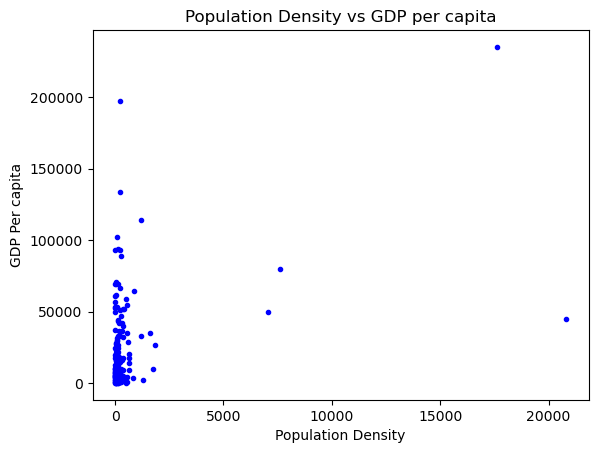

In [26]:
fig=plt.figure()
plt.plot(df_tmp[series[0]],df_tmp[series[1]],'.b')
plt.xlabel('Population Density')
plt.ylabel('GDP Per capita')
plt.title('Population Density vs GDP per capita')
plt.show()

In [24]:
alt.Chart(df_tmp,title='Population Density vs GDP per capita').mark_point().encode(
    x=series[0],
    y=series[1],
    tooltip=['Country','economy',series[0],series[1]]
).properties(
    height=300,
    width=700
).interactive()

alt.Chart(...)

In [415]:
countries=['USA','CHN','IND','FRA']
series='NY.GDP.PCAP.CD'
years=[str(year) for year in np.arange(1960,2023,1)]
cols_to_keep=['Country']+years
df_filter_data=df_data[(df_data['economy'].isin(countries))&(df_data['series']==series)]
title=df_filter_data.iloc[-1]['Series']
countries=df_filter_data.Country.tolist()
df_filter_data=df_filter_data[cols_to_keep]
df_filter_data

,Country,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
4000,United States,2999.864872,3059.160821,3236.013112,3366.369790,3565.314430,3818.288251,4136.308296,4325.959351,4684.588403,...,53409.750777,55304.315532,57040.208214,58206.614193,60322.261424,63201.045848,65548.070785,64317.398913,71055.876194,77246.673883
4117,India,83.035102,85.969704,90.276869,101.315165,115.487608,119.084977,89.201348,96.046330,99.516836,...,1438.057005,1559.863779,1590.174331,1714.279537,1957.969813,1974.377731,2050.163800,1915.551588,2250.179018,2366.309609
4138,France,1333.881573,1430.434624,1585.735311,1758.856659,1928.999402,2060.299715,2209.000173,2363.669669,2553.975843,...,42602.717965,43068.548724,36652.922305,37062.533572,38781.049487,41557.854859,40494.898294,39179.744260,43671.308410,40886.253268
4165,China,89.520214,75.805561,70.909152,74.313372,85.498243,98.486418,104.324185,96.589179,91.472384,...,7020.386074,7636.074340,8016.445595,8094.390167,8817.045608,9905.406383,10143.860221,10408.719554,12617.505104,12662.583169


In [19]:
title

'GDP per capita (current US$)'

In [20]:
countries

['United States', 'India', 'France', 'China']

In [21]:
df_filter_data=df_filter_data.rename({'Country':''},axis=1)
df_filter_data.set_index('',inplace=True)
df_filter_data=df_filter_data.T.reset_index()
df_filter_data = df_filter_data.rename({'index':'Year'},axis=1)
df_filter_data

,Year,United States,India,France,China
0,1980,12574.791506,267.395220,12738.520052,194.804722
1,1981,13976.105393,271.426149,11116.861058,197.071474
2,1982,14433.787727,275.266086,10501.609135,203.334920
3,1983,15543.893717,292.644647,9998.975219,225.431929
4,1984,17121.225485,278.095415,9430.069648,250.713969
5,1985,18236.827727,297.999249,9778.085305,294.458849
6,1986,19071.227195,312.059844,13566.660773,281.928121
7,1987,20038.941099,342.071924,16340.725971,251.811957
8,1988,21417.011931,355.738410,17727.510834,283.537695
9,1989,22857.154433,347.462030,17747.581598,310.881912


In [10]:
df_filter_data

,Year,United States,India,France,China
0,1980,12574.791506,267.395220,12738.520052,194.804722
1,1981,13976.105393,271.426149,11116.861058,197.071474
2,1982,14433.787727,275.266086,10501.609135,203.334920
3,1983,15543.893717,292.644647,9998.975219,225.431929
4,1984,17121.225485,278.095415,9430.069648,250.713969
5,1985,18236.827727,297.999249,9778.085305,294.458849
6,1986,19071.227195,312.059844,13566.660773,281.928121
7,1987,20038.941099,342.071924,16340.725971,251.811957
8,1988,21417.011931,355.738410,17727.510834,283.537695
9,1989,22857.154433,347.462030,17747.581598,310.881912


In [28]:
selection = alt.selection_interval(fields=countries, bind='legend')

alt.Chart(df_filter_data,title=alt.Title(title)).mark_line(point=True).encode(
    x=alt.X('Year',type='quantitative'),
    y=alt.Y(alt.repeat('layer'),type='quantitative',title=title),
    color=alt.ColorDatum(alt.repeat('layer')),
    opacity=alt.condition(selection, alt.value(1), alt.value(0.2)),
    tooltip=['Year']+countries
).properties(
    height=300,
    width=700
).repeat(layer=countries).add_params(selection)#.interactive()

alt.RepeatChart(...)

In [136]:
countries

['United States', 'India', 'France', 'China']

In [11]:
df_filter_data

,Year,United States,India,France,China
0,1980,12574.791506,267.395220,12738.520052,194.804722
1,1981,13976.105393,271.426149,11116.861058,197.071474
2,1982,14433.787727,275.266086,10501.609135,203.334920
3,1983,15543.893717,292.644647,9998.975219,225.431929
4,1984,17121.225485,278.095415,9430.069648,250.713969
5,1985,18236.827727,297.999249,9778.085305,294.458849
6,1986,19071.227195,312.059844,13566.660773,281.928121
7,1987,20038.941099,342.071924,16340.725971,251.811957
8,1988,21417.011931,355.738410,17727.510834,283.537695
9,1989,22857.154433,347.462030,17747.581598,310.881912


In [66]:
df_long=df_data.melt(id_vars=["economy", "Country","series","Series"],
        var_name="Year",
        value_name="Value")
df_long

,economy,Country,series,Series,Year,Value
0,ZWE,Zimbabwe,SL.UEM.TOTL.NE.ZS,"Unemployment, total (% of total labor force) (...",1960,NaN
1,ZMB,Zambia,SL.UEM.TOTL.NE.ZS,"Unemployment, total (% of total labor force) (...",1960,NaN
2,YEM,"Yemen, Rep.",SL.UEM.TOTL.NE.ZS,"Unemployment, total (% of total labor force) (...",1960,NaN
3,PSE,West Bank and Gaza,SL.UEM.TOTL.NE.ZS,"Unemployment, total (% of total labor force) (...",1960,NaN
4,VIR,Virgin Islands (U.S.),SL.UEM.TOTL.NE.ZS,"Unemployment, total (% of total labor force) (...",1960,NaN
...,...,...,...,...,...,...
1307119,CEB,Central Europe and the Baltics,EG.USE.COMM.CL.ZS,Alternative and nuclear energy (% of total ene...,2022,NaN
1307120,CSS,Caribbean small states,EG.USE.COMM.CL.ZS,Alternative and nuclear energy (% of total ene...,2022,NaN
1307121,ARB,Arab World,EG.USE.COMM.CL.ZS,Alternative and nuclear energy (% of total ene...,2022,NaN
1307122,AFW,Africa Western and Central,EG.USE.COMM.CL.ZS,Alternative and nuclear energy (% of total ene...,2022,NaN


In [47]:
df_long_filtered=df_long[(df_long['series']==series)&(df_long['Country'].isin(countries))]
df_long_filtered

,economy,Country,series,Series,Year,Value
3265,USA,United States,NY.GDP.PCAP.CD,GDP per capita (current US$),1980,12574.791506
3382,IND,India,NY.GDP.PCAP.CD,GDP per capita (current US$),1980,267.395220
3403,FRA,France,NY.GDP.PCAP.CD,GDP per capita (current US$),1980,12738.520052
3430,CHN,China,NY.GDP.PCAP.CD,GDP per capita (current US$),1980,194.804722
16719,USA,United States,NY.GDP.PCAP.CD,GDP per capita (current US$),1981,13976.105393
...,...,...,...,...,...,...
555044,CHN,China,NY.GDP.PCAP.CD,GDP per capita (current US$),2021,12617.505104
568333,USA,United States,NY.GDP.PCAP.CD,GDP per capita (current US$),2022,77246.673883
568450,IND,India,NY.GDP.PCAP.CD,GDP per capita (current US$),2022,2366.309609
568471,FRA,France,NY.GDP.PCAP.CD,GDP per capita (current US$),2022,40886.253268


In [48]:
# df_long_filtered.loc[:,'NumerizedValue']=df_long_filtered.loc[:,'Value'].apply(lambda x: numerize.numerize(x,2))
# df_long_filtered

In [49]:
chart=alt.Chart(df_long_filtered).mark_line(point=True).encode(
  x='Year:T',
  y=alt.Y('Value',type='quantitative',title=series),
  color='Country:N'
).properties(
    height=300,
    width=500,
    title=series
).configure_axis(
    grid=True
).configure_view(
    stroke=None
).interactive()

chart.configure_title(
    fontSize=20,
    font='Courier',
    anchor='start',
    color='gray'
)


alt.Chart(...)

In [148]:
df_long_filtered=df_long[df_long['series']==series]#&(df_long['Country'].isin(countries))]
df_long_filtered

,economy,Country,series,Series,Year,Value
3255,ZWE,Zimbabwe,NY.GDP.PCAP.CD,GDP per capita (current US$),1980,947.367135
3256,ZMB,Zambia,NY.GDP.PCAP.CD,GDP per capita (current US$),1980,678.774900
3257,YEM,"Yemen, Rep.",NY.GDP.PCAP.CD,GDP per capita (current US$),1980,NaN
3258,PSE,West Bank and Gaza,NY.GDP.PCAP.CD,GDP per capita (current US$),1980,NaN
3259,VIR,Virgin Islands (U.S.),NY.GDP.PCAP.CD,GDP per capita (current US$),1980,NaN
...,...,...,...,...,...,...
568535,AND,Andorra,NY.GDP.PCAP.CD,GDP per capita (current US$),2022,42350.697069
568536,ASM,American Samoa,NY.GDP.PCAP.CD,GDP per capita (current US$),2022,19673.390102
568537,DZA,Algeria,NY.GDP.PCAP.CD,GDP per capita (current US$),2022,5023.252932
568538,ALB,Albania,NY.GDP.PCAP.CD,GDP per capita (current US$),2022,6810.114041


In [17]:
title=df_long_filtered.iloc[0]['Series']
title

'GDP per capita (current US$)'

In [152]:
# !pip install "vegafusion[embed]"

In [153]:
# alt.data_transformers.enable("vegafusion")
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [18]:
chart=alt.Chart(df_long_filtered,title=alt.Title(title,subtitle=series)).mark_line(point=True).encode(
  x='Year:T',
  y=alt.Y('Value:Q').title(title),
  color='Country:N'
).properties(
    height=600,
    width=800
).configure_axis(
    grid=False
).configure_view(
    stroke=None
)

chart.configure_title(
    fontSize=20,
    font='Courier',
    anchor='start',
    color='gray',
    subtitleFont='Courier',
    subtitleColor='gray'
)


alt.Chart(...)

In [178]:
year='2020'
df_long_filtered=df_long[(df_long['series']==series)&(df_long['Year']==year)]
df_long_filtered

,economy,Country,series,Series,Year,Value
541415,ZWE,Zimbabwe,NY.GDP.PCAP.CD,GDP per capita (current US$),2020,1372.696674
541416,ZMB,Zambia,NY.GDP.PCAP.CD,GDP per capita (current US$),2020,958.264901
541417,YEM,"Yemen, Rep.",NY.GDP.PCAP.CD,GDP per capita (current US$),2020,626.309169
541418,PSE,West Bank and Gaza,NY.GDP.PCAP.CD,GDP per capita (current US$),2020,3233.568638
541419,VIR,Virgin Islands (U.S.),NY.GDP.PCAP.CD,GDP per capita (current US$),2020,39411.045254
...,...,...,...,...,...,...
541627,AND,Andorra,NY.GDP.PCAP.CD,GDP per capita (current US$),2020,37207.221999
541628,ASM,American Samoa,NY.GDP.PCAP.CD,GDP per capita (current US$),2020,15609.777220
541629,DZA,Algeria,NY.GDP.PCAP.CD,GDP per capita (current US$),2020,3794.409524
541630,ALB,Albania,NY.GDP.PCAP.CD,GDP per capita (current US$),2020,5343.037704


In [182]:
# series=''
from altair import datum

alt.Chart(df_long_filtered).mark_bar().encode(
    alt.X("sum(value):Q").title(title),
    alt.Y("Country:N"),
    color=alt.Color(
            "Country",
            # legend=alt.Legend(title="Language"),
            # scale=github_scale,
        )
)

alt.Chart(...)

In [30]:
df_data.series.nunique()

62

In [67]:
series='GDP per capita (current US$)'
region='ARB'
year='2020'
members=df_regions[df_regions['name']==region]['members'].values[0]
members=members.split(',')

df_long_filtered=df_long[(df_long['Series']==series)&(df_long['economy'].isin(members) &(df_long['']==)]
df_long_filtered

,economy,Country,series,Series,Year,Value
4253,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),1960,NaN
25001,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),1961,NaN
45749,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),1962,NaN
66497,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),1963,NaN
87245,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),1964,NaN
...,...,...,...,...,...,...
1207637,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),2018,6624.834659
1228385,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),2019,6565.980840
1249133,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),2020,5735.509867
1269881,ARB,Arab World,NY.GDP.PCAP.CD,GDP per capita (current US$),2021,6503.793376


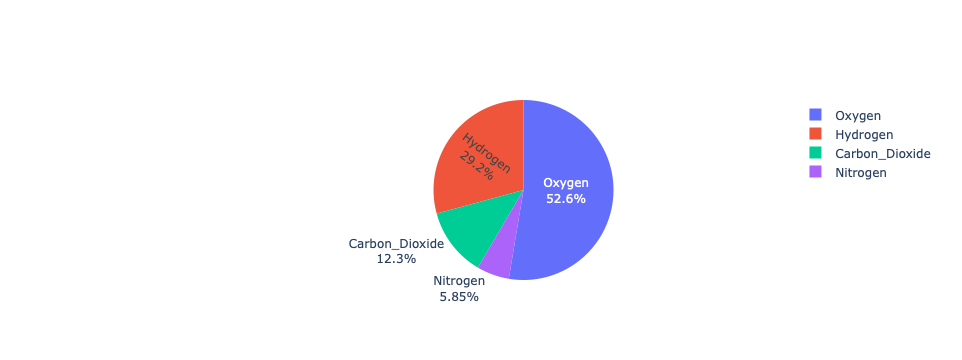

In [34]:
import plotly.graph_objects as go

labels = ['Oxygen','Hydrogen','Carbon_Dioxide','Nitrogen']
values = [4500, 2500, 1053, 500]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                             insidetextorientation='radial'
                            )])
fig.show()

### Analyzing Market data

Source: https://en.wikipedia.org/wiki/List_of_countries_by_stock_market_capitalization#cite_note-1

In [47]:
market_cols=['CM.MKT.LCAP.CD','CM.MKT.LCAP.GD.ZS','CM.MKT.LDOM.NO']
df_market_data=df_data[df_data['series'].isin(market_cols)]
df_market_data.head()

,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
36974,ZWE,CM.MKT.LCAP.CD,Zimbabwe,Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36975,ZMB,CM.MKT.LCAP.CD,Zambia,Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.716490e+09,4.034770e+09,4.037230e+09
36976,YEM,CM.MKT.LCAP.CD,"Yemen, Rep.",Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36977,PSE,CM.MKT.LCAP.CD,West Bank and Gaza,Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,...,3.247480e+09,3.187260e+09,3.339200e+09,3.390120e+09,3.891490e+09,3.734920e+09,3.757500e+09,3.446910e+09,4.407120e+09,4.896180e+09
36978,VIR,CM.MKT.LCAP.CD,Virgin Islands (U.S.),Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [91]:
cols_to_drop=['economy','series']
df_market_wide=df_market_data.drop(cols_to_drop,axis=1)
df_market_wide

,Country,Series,1960,1961,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
36974,Zimbabwe,Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36975,Zambia,Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.716490e+09,4.034770e+09,4.037230e+09
36976,"Yemen, Rep.",Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36977,West Bank and Gaza,Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.247480e+09,3.187260e+09,3.339200e+09,3.390120e+09,3.891490e+09,3.734920e+09,3.757500e+09,3.446910e+09,4.407120e+09,4.896180e+09
36978,Virgin Islands (U.S.),Market capitalization of listed domestic compa...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39363,Central Europe and the Baltics,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39364,Caribbean small states,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39365,Arab World,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39366,Africa Western and Central,"Listed domestic companies, total",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
year='2022'
cols_to_keep=['Country','Series',year]
df_market=df_market_wide[cols_to_keep]
df_market=df_market.pivot(index='Country', columns='Series', values=year)
df_market.dropna(how='all', axis=0, inplace=True)
df_market=df_market[df_market.index.isin(countries)]
cols_to_keep=['Market capitalization of listed domestic companies (current US$)','Market capitalization of listed domestic companies (% of GDP)']
df_market=df_market[cols_to_keep]
df_market=df_market.sort_values(by='Market capitalization of listed domestic companies (current US$)',axis=0,ascending=False)
df_market

Series,Market capitalization of listed domestic companies (current US$),Market capitalization of listed domestic companies (% of GDP)
Country,,
United States,4.029798e+13,156.532828
China,1.146935e+13,64.139833
Japan,5.380475e+12,126.408746
"Hong Kong SAR, China",4.566809e+12,1273.168848
India,3.603482e+12,107.455320
...,...,...
Namibia,2.158680e+09,17.176999
Azerbaijan,1.467980e+09,1.862742
Seychelles,1.215830e+09,59.079135


In [105]:
years=[str(year) for year in np.arange(1960,2022,1)]
series_to_keep=['Market capitalization of listed domestic companies (current US$)','Market capitalization of listed domestic companies (% of GDP)']
df_market_wld=df_market_wide[(df_market_wide['Country']=='World') & (df_market_wide['Series'].isin(series_to_keep))]

cols_to_keep=['Series']+years
df_market_wld=df_market_wld[cols_to_keep]
df_market_wld=df_market_wld.set_index('Series')
df_market_wld=df_market_wld.T.reset_index(names='Year')
df_market_wld.dropna(subset=series_to_keep, axis=0, inplace=True)
df_market_wld=df_market_wld.sort_values(by='Market capitalization of listed domestic companies (current US$)',axis=0,ascending=True)
df_market_wld['Market capitalization of listed domestic companies (current US$)']=df_market_wld['Market capitalization of listed domestic companies (current US$)']/1000000
df_market_wld

Series,Year,Market capitalization of listed domestic companies (current US$),Market capitalization of listed domestic companies (% of GDP)
15,1975,1.148844e+06,27.068995
16,1976,1.333998e+06,30.627681
17,1977,1.361013e+06,26.223425
18,1978,1.524500e+06,23.401645
19,1979,1.956333e+06,25.584780
21,1981,2.342724e+06,27.679685
20,1980,2.525736e+06,29.632355
22,1982,2.702430e+06,31.066059
24,1984,3.287495e+06,34.421812
23,1983,3.340769e+06,36.597081


### Ranking Economies (Top/Bottom)

In [218]:
year='2022'
series='BN.CAB.XOKA.GD.ZS' #'GC.DOD.TOTL.GD.ZS'
title=df_data[df_data['series']==series]['Series'].unique()[0]
ascending=False
show_num_of_rows=100
title

'Current account balance (% of GDP)'

In [219]:
df_tmp=df_data[(df_data['series']==series)&(df_data.Country.isin(countries))]
df_tmp=df_tmp.dropna(subset=years, how='all',axis=0)
df_tmp

,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
6916,ZWE,BN.CAB.XOKA.GD.ZS,Zimbabwe,Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,-13.874382,-11.971153,-7.998095,-3.394138,-1.542184,-4.039183,4.216114,5.096583,NaN,NaN
6917,ZMB,BN.CAB.XOKA.GD.ZS,Zambia,Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,-0.575956,-1.427094,-3.612272,-4.551688,-1.681271,-1.301167,0.603691,11.790957,11.900351,3.747847
6918,YEM,BN.CAB.XOKA.GD.ZS,"Yemen, Rep.",Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,-3.786914,-3.442753,-7.129370,-7.723911,NaN,NaN,NaN,NaN,NaN,NaN
6919,PSE,BN.CAB.XOKA.GD.ZS,West Bank and Gaza,Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,-14.772393,-13.586910,-13.878918,-13.907762,-13.206561,-13.150031,-10.385480,-12.251111,-9.818047,-10.626523
6921,VNM,BN.CAB.XOKA.GD.ZS,Viet Nam,Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,3.624090,4.008970,-0.853053,0.243100,-0.586095,1.902364,3.918244,4.344869,-1.262843,0.341681
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7127,AGO,BN.CAB.XOKA.GD.ZS,Angola,Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,6.154696,-2.756200,-11.351656,-5.847424,-0.858822,9.317234,7.246181,1.797711,12.629780,11.267153
7128,AND,BN.CAB.XOKA.GD.ZS,Andorra,Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,18.010470,15.526431,14.059545,17.251325
7130,DZA,BN.CAB.XOKA.GD.ZS,Algeria,Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,0.517147,-3.877216,-14.420545,-14.496288,-11.621768,-8.689413,-8.763736,-11.030910,-2.421090,8.622273
7131,ALB,BN.CAB.XOKA.GD.ZS,Albania,Current account balance (% of GDP),NaN,NaN,NaN,NaN,NaN,NaN,...,-9.274188,-10.775399,-8.604880,-7.590826,-7.544229,-6.704922,-7.913711,-8.669828,-7.638883,-5.903749


In [222]:
df_rank=df_data[(df_data['series']==series)&(df_data.Country.isin(countries))]
cols_to_keep=['Country', year]
df_rank=df_rank[cols_to_keep]
df_rank=df_rank.set_index('Country')
df_rank=df_rank.sort_values(by=year, axis=0, ascending=ascending)
df_rank=df_rank.dropna(subset=year, axis=0)
print(df_rank.shape)
df_rank_show=df_rank[:]
df_rank_show

(168, 1)


,2022
Country,
Kuwait,34.504555
Norway,29.836771
Azerbaijan,29.791695
Qatar,26.770899
Iraq,20.237731
...,...
Curacao,-28.540317
Lebanon,-34.606227
Mozambique,-37.378865


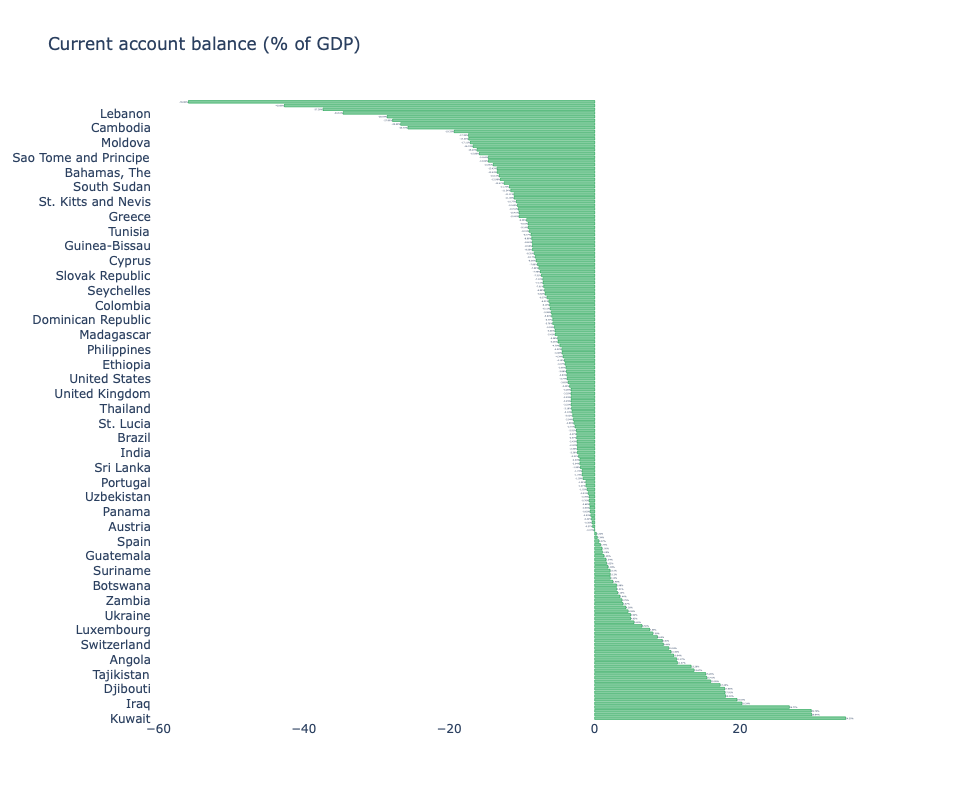

In [370]:
import plotly.graph_objects as go

fig = go.Figure(go.Bar(
            x=df_rank_show[year],
            y=df_rank_show.index,
            orientation='h',
            text=["{:,.2f}%".format(x) for x in df_rank_show[year]],
            textposition='outside',
            hoverinfo=['text'],
            marker=dict(
                    color='rgba(50, 171, 96, 0.6)',
                    line=dict(
                    color='rgba(50, 171, 96, 1.0)',
                    width=.7
                    )
            ),
            width=.7
    ))

fig.update_layout(width=1000, height=800,
    title_text=title,margin=dict(
        pad=0
    ),plot_bgcolor='#fff',
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.show()

### Life Expectancy vs GDP per capita per population sizes

In [288]:
import plotly.express as px

df = px.data.gapminder()
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


In [315]:
df['continent'].unique()

array(['Asia', 'Europe', 'Africa', 'Americas', 'Oceania'], dtype=object)

In [379]:
df_data.shape

(39368, 67)

In [375]:
cols_to_keep=['name','aggregate','longitude','latitude','region','incomeLevel','capitalCity']
df_economies_filt=df_economies[cols_to_keep]
df_economies_filt.reset_index(inplace=True)
print(df_economies_filt.shape)
df_economies_filt.head()

(266, 8)


,id,name,aggregate,longitude,latitude,region,incomeLevel,capitalCity
0,ABW,Aruba,False,-70.0167,12.51670,Latin America & Caribbean,High income,Oranjestad
1,AFE,Africa Eastern and Southern,True,NaN,NaN,None,None,
2,AFG,Afghanistan,False,69.1761,34.52280,South Asia,Low income,Kabul
3,AFW,Africa Western and Central,True,NaN,NaN,None,None,
4,AGO,Angola,False,13.2420,-8.81155,Sub-Saharan Africa,Lower middle income,Luanda


In [380]:
df_data_merged=df_data.merge(df_economies_filt,how='left',left_on='economy',right_on='id')
print(df_data_merged.shape)
df_data_merged.head()

(39368, 75)


,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2021,2022,id,name,aggregate,longitude,latitude,region,incomeLevel,capitalCity
0,ZWE,SL.UEM.TOTL.NE.ZS,Zimbabwe,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,9.540,10.087,ZWE,Zimbabwe,False,31.0672,-17.8312,Sub-Saharan Africa,Lower middle income,Harare
1,ZMB,SL.UEM.TOTL.NE.ZS,Zambia,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,5.195,5.993,ZMB,Zambia,False,28.2937,-15.3982,Sub-Saharan Africa,Lower middle income,Lusaka
2,YEM,SL.UEM.TOTL.NE.ZS,"Yemen, Rep.","Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,YEM,"Yemen, Rep.",False,44.2075,15.3520,Middle East & North Africa,Low income,Sana'a
3,PSE,SL.UEM.TOTL.NE.ZS,West Bank and Gaza,"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,26.390,24.420,PSE,West Bank and Gaza,False,NaN,NaN,Middle East & North Africa,Lower middle income,
4,VIR,SL.UEM.TOTL.NE.ZS,Virgin Islands (U.S.),"Unemployment, total (% of total labor force) (...",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,VIR,Virgin Islands (U.S.),False,-64.8963,18.3358,Latin America & Caribbean,High income,Charlotte Amalie


In [381]:
df_data_merged[df_data_merged['Country']!=df_data_merged['name']]

,economy,series,Country,Series,1960,1961,1962,1963,1964,1965,...,2021,2022,id,name,aggregate,longitude,latitude,region,incomeLevel,capitalCity


In [417]:
cols_to_keep=['economy','Country','region','Series','series','incomeLevel','capitalCity','longitude','latitude','aggregate']+years
df_data_merged=df_data_merged[cols_to_keep]
df_data_merged.head()

KeyError: "['2022'] not in index"

In [418]:
gdp_per_cap='NY.GDP.PCAP.CD'
life_expec='SP.DYN.LE00.IN'
pop='SP.POP.TOTL'
series=[gdp_per_cap,life_expec,pop]
df_filtered=df_data_merged[(df_data_merged['series'].isin(series))&(df_data.Country.isin(countries))]
df_filtered=df_filtered.drop('series',axis=1)
print(df_filtered.shape)
df_filtered.head()

(12, 71)


,economy,Country,region,Series,incomeLevel,capitalCity,longitude,latitude,aggregate,1960,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
4000,USA,United States,North America,GDP per capita (current US$),High income,Washington D.C.,-77.03200,38.8895,False,2.999865e+03,...,5.178441e+04,5.340975e+04,5.530432e+04,5.704021e+04,5.820661e+04,6.032226e+04,6.320105e+04,6.554807e+04,6.431740e+04,7.105588e+04
4117,IND,India,South Asia,GDP per capita (current US$),Lower middle income,New Delhi,77.22500,28.6353,False,8.303510e+01,...,1.434018e+03,1.438057e+03,1.559864e+03,1.590174e+03,1.714280e+03,1.957970e+03,1.974378e+03,2.050164e+03,1.915552e+03,2.250179e+03
4138,FRA,France,Europe & Central Asia,GDP per capita (current US$),High income,Paris,2.35097,48.8566,False,1.333882e+03,...,4.087085e+04,4.260272e+04,4.306855e+04,3.665292e+04,3.706253e+04,3.878105e+04,4.155785e+04,4.049490e+04,3.917974e+04,4.367131e+04
4165,CHN,China,East Asia & Pacific,GDP per capita (current US$),Upper middle income,Beijing,116.28600,40.0495,False,8.952021e+01,...,6.300582e+03,7.020386e+03,7.636074e+03,8.016446e+03,8.094390e+03,8.817046e+03,9.905406e+03,1.014386e+04,1.040872e+04,1.261751e+04
9320,USA,United States,North America,"Population, total",High income,Washington D.C.,-77.03200,38.8895,False,1.806710e+08,...,3.138777e+08,3.160599e+08,3.183863e+08,3.207390e+08,3.230718e+08,3.251221e+08,3.268382e+08,3.283300e+08,3.315269e+08,3.320490e+08


In [387]:
df_tmp=df_filtered.melt(id_vars=['economy','Country','region','Series'], value_vars=years, var_name='year', value_name='value')
df_tmp

,economy,Country,region,Series,year,value
0,ZWE,Zimbabwe,Sub-Saharan Africa,GDP per capita (current US$),1960,276.643363
1,ZMB,Zambia,Sub-Saharan Africa,GDP per capita (current US$),1960,228.567399
2,YEM,"Yemen, Rep.",Middle East & North Africa,GDP per capita (current US$),1960,NaN
3,PSE,West Bank and Gaza,Middle East & North Africa,GDP per capita (current US$),1960,NaN
4,VIR,Virgin Islands (U.S.),Latin America & Caribbean,GDP per capita (current US$),1960,NaN
...,...,...,...,...,...,...
40357,AND,Andorra,Europe & Central Asia,"Life expectancy at birth, total (years)",2021,NaN
40358,ASM,American Samoa,East Asia & Pacific,"Life expectancy at birth, total (years)",2021,NaN
40359,DZA,Algeria,Middle East & North Africa,"Life expectancy at birth, total (years)",2021,76.377000
40360,ALB,Albania,Europe & Central Asia,"Life expectancy at birth, total (years)",2021,76.463000


In [388]:
df_tmp=df_tmp.pivot(columns='Series',index=['region','economy','Country','year'],values='value').reset_index()
df_tmp

Series,region,economy,Country,year,GDP per capita (current US$),"Life expectancy at birth, total (years)","Population, total"
0,East Asia & Pacific,ASM,American Samoa,1960,NaN,NaN,20085.0
1,East Asia & Pacific,ASM,American Samoa,1961,NaN,NaN,20626.0
2,East Asia & Pacific,ASM,American Samoa,1962,NaN,NaN,21272.0
3,East Asia & Pacific,ASM,American Samoa,1963,NaN,NaN,21949.0
4,East Asia & Pacific,ASM,American Samoa,1964,NaN,NaN,22656.0
...,...,...,...,...,...,...,...
13449,Sub-Saharan Africa,ZWE,Zimbabwe,2017,1192.107012,60.709,14751101.0
13450,Sub-Saharan Africa,ZWE,Zimbabwe,2018,2269.177012,61.414,15052184.0
13451,Sub-Saharan Africa,ZWE,Zimbabwe,2019,1421.868596,61.292,15354608.0
13452,Sub-Saharan Africa,ZWE,Zimbabwe,2020,1372.696674,61.124,15669666.0


In [389]:
df_tmp.isna().sum()

Series
region                                        0
economy                                       0
Country                                       0
year                                          0
GDP per capita (current US$)               2692
Life expectancy at birth, total (years)     563
Population, total                            30
dtype: int64

In [390]:
df_tmp[df_tmp['Population, total'].isna()]

Series,region,economy,Country,year,GDP per capita (current US$),"Life expectancy at birth, total (years)","Population, total"
9424,Middle East & North Africa,PSE,West Bank and Gaza,1960,NaN,NaN,NaN
9425,Middle East & North Africa,PSE,West Bank and Gaza,1961,NaN,NaN,NaN
9426,Middle East & North Africa,PSE,West Bank and Gaza,1962,NaN,NaN,NaN
9427,Middle East & North Africa,PSE,West Bank and Gaza,1963,NaN,NaN,NaN
9428,Middle East & North Africa,PSE,West Bank and Gaza,1964,NaN,NaN,NaN
9429,Middle East & North Africa,PSE,West Bank and Gaza,1965,NaN,NaN,NaN
9430,Middle East & North Africa,PSE,West Bank and Gaza,1966,NaN,NaN,NaN
9431,Middle East & North Africa,PSE,West Bank and Gaza,1967,NaN,NaN,NaN
9432,Middle East & North Africa,PSE,West Bank and Gaza,1968,NaN,NaN,NaN
9433,Middle East & North Africa,PSE,West Bank and Gaza,1969,NaN,NaN,NaN


In [391]:
df_tmp.dropna(subset=['Population, total'], how='all', inplace=True)

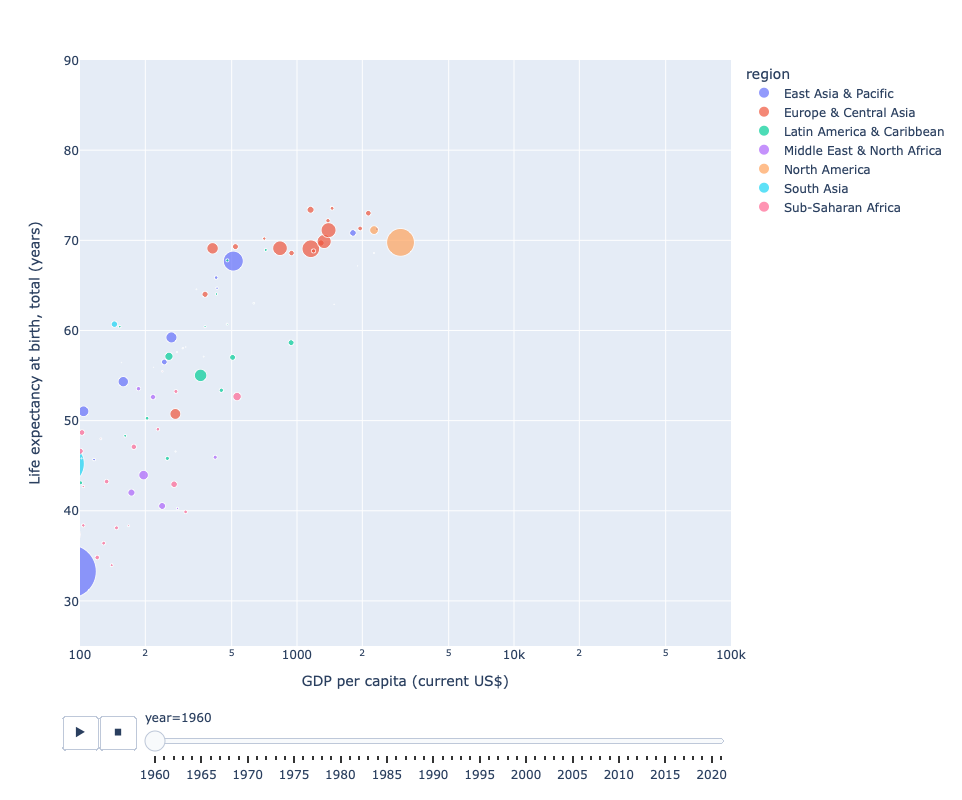

In [395]:
fig=px.scatter(df_tmp, x="GDP per capita (current US$)", y="Life expectancy at birth, total (years)", 
           animation_frame="year", animation_group="Country", size="Population, total", 
           color="region", 
           hover_name="Country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])
fig.update_layout(
    autosize=False,
    width=1000,
    height=800,
)

fig.show()

## Exploring GeoData

In [318]:
# !conda install --channel conda-forge geopandas -y
# !pip install geodatasets

In [198]:
regions=df_regions['code'].to_list()
regions

['AFE',
 'AFR',
 'AFW',
 'ARB',
 'CAA',
 'CEA',
 'CEB',
 'CEU',
 'CLA',
 'CME',
 'CSA',
 'CSS',
 'EAP',
 'EAR',
 'EAS',
 'ECA',
 'ECS',
 'EMU',
 'EUU',
 'FCS',
 'HPC',
 'LAC',
 'LCN',
 'LDC',
 'LTE',
 'MDE',
 'MEA',
 'MNA',
 'NAC',
 'NAF',
 'NRS',
 'OED',
 'OSS',
 'PRE',
 'PSS',
 'PST',
 'RRS',
 'SAS',
 'SSA',
 'SSF',
 'SST',
 'SXZ',
 'WLD',
 'XZN']

In [242]:
import geopandas
RAW='RAW'
zipfile='wb_countries_admin0_10m.zip!WB_countries_Admin0_10m'
path_to_file=os.path.join(DATAPATH,RAW,zipfile)
df_geo = geopandas.read_file(path_to_file)
print(df_geo.shape)
df_geo

(251, 53)


,OBJECTID,featurecla,LEVEL,TYPE,FORMAL_EN,FORMAL_FR,POP_EST,POP_RANK,GDP_MD_EST,POP_YEAR,...,NAME_SV,NAME_TR,NAME_VI,NAME_ZH,WB_NAME,WB_RULES,WB_REGION,Shape_Leng,Shape_Area,geometry
0,1,Admin-0 country,2,Sovereign country,Republic of Indonesia,None,260580739,17,3028000.0,2017,...,Indonesien,Endonezya,Indonesia,印度尼西亚,Indonesia,None,EAP,495.029918,153.078608,"MULTIPOLYGON (((117.70361 4.16341, 117.70361 4..."
1,2,Admin-0 country,2,Sovereign country,Malaysia,None,31381992,15,863000.0,2017,...,Malaysia,Malezya,Malaysia,马来西亚,Malaysia,None,EAP,68.456913,26.703172,"MULTIPOLYGON (((117.70361 4.16341, 117.69711 4..."
2,3,Admin-0 country,2,Sovereign country,Republic of Chile,None,17789267,14,436100.0,2017,...,Chile,Şili,Chile,智利,Chile,None,LCR,416.997272,76.761813,"MULTIPOLYGON (((-69.51009 -17.50659, -69.50611..."
3,4,Admin-0 country,2,Sovereign country,Plurinational State of Bolivia,None,11138234,14,78350.0,2017,...,Bolivia,Bolivya,Bolivia,玻利維亞,Bolivia,None,LCR,54.345991,92.203587,"POLYGON ((-69.51009 -17.50659, -69.51009 -17.5..."
4,5,Admin-0 country,2,Sovereign country,Republic of Peru,None,31036656,15,410400.0,2017,...,Peru,Peru,Peru,秘鲁,Peru,None,LCR,73.262192,106.417089,"MULTIPOLYGON (((-69.51009 -17.50659, -69.63832..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,247,Admin-0 country,2,Dependency,None,None,300,2,0.0,0,...,Förenta staternas mindre öar i Oceanien och Vä...,United States Minor Outlying Islands,Các tiểu đảo xa của Hoa Kỳ,美国本土外小岛屿,Navassa Island (US),Name in italic,Other,0.085608,0.000413,"POLYGON ((-75.02432 18.41726, -75.02107 18.415..."
247,248,Admin-0 country,2,Dependency,None,None,300,2,0.0,0,...,Förenta staternas mindre öar i Oceanien och Vä...,United States Minor Outlying Islands,Các tiểu đảo xa của Hoa Kỳ,美国本土外小岛屿,Palmyra Atoll (US),Name in italic,Other,0.147363,0.000576,"POLYGON ((-162.06086 5.88719, -162.05761 5.882..."
248,249,Admin-0 country,2,Dependency,None,None,300,2,0.0,0,...,Förenta staternas mindre öar i Oceanien och Vä...,United States Minor Outlying Islands,Các tiểu đảo xa của Hoa Kỳ,美国本土外小岛屿,Kingman Reef (US),Name in italic,Other,0.059570,0.000222,"POLYGON ((-162.40018 6.44514, -162.38528 6.445..."
249,250,Admin-0 country,2,Country,New Zealand,None,4510327,12,174800.0,2017,...,Nya Zeeland,Yeni Zelanda,New Zealand,新西兰,Tokelau (NZ),Name in italic,Other,0.178453,0.000348,"MULTIPOLYGON (((-171.18566 -9.36126, -171.1883..."


In [10]:
df_geo.isna().sum()

OBJECTID        0
featurecla      0
LEVEL           0
TYPE            0
FORMAL_EN      22
FORMAL_FR     246
POP_EST         0
POP_RANK        0
GDP_MD_EST      0
POP_YEAR        0
LASTCENSUS      0
GDP_YEAR        0
ECONOMY         0
INCOME_GRP      0
FIPS_10_        0
ISO_A2          0
ISO_A3          0
ISO_A3_EH       0
ISO_N3          0
UN_A3           0
WB_A2           6
WB_A3           0
CONTINENT       0
REGION_UN       0
SUBREGION       0
REGION_WB       0
NAME_AR         0
NAME_BN         3
NAME_DE         0
NAME_EN         0
NAME_ES         0
NAME_FR         0
NAME_EL         0
NAME_HI         1
NAME_HU         0
NAME_ID         0
NAME_IT         0
NAME_JA         0
NAME_KO         0
NAME_NL         0
NAME_PL         0
NAME_PT         0
NAME_RU         0
NAME_SV         0
NAME_TR         0
NAME_VI         0
NAME_ZH         1
WB_NAME         0
WB_RULES        0
WB_REGION       0
Shape_Leng      0
Shape_Area      0
geometry        0
dtype: int64

In [243]:
cols_to_keep=['FORMAL_EN','TYPE','ISO_A3','ISO_A3_EH','WB_A3','CONTINENT','REGION_UN','SUBREGION','REGION_WB','NAME_EN','WB_NAME','Shape_Leng','Shape_Area','geometry'
             ]
df_geo=df_geo[cols_to_keep]
print(df_geo.shape)
df_geo.head()

(251, 14)


,FORMAL_EN,TYPE,ISO_A3,ISO_A3_EH,WB_A3,CONTINENT,REGION_UN,SUBREGION,REGION_WB,NAME_EN,WB_NAME,Shape_Leng,Shape_Area,geometry
0,Republic of Indonesia,Sovereign country,IDN,IDN,IDN,Asia,Asia,South-Eastern Asia,East Asia & Pacific,Indonesia,Indonesia,495.029918,153.078608,"MULTIPOLYGON (((117.70361 4.16341, 117.70361 4..."
1,Malaysia,Sovereign country,MYS,MYS,MYS,Asia,Asia,South-Eastern Asia,East Asia & Pacific,Malaysia,Malaysia,68.456913,26.703172,"MULTIPOLYGON (((117.70361 4.16341, 117.69711 4..."
2,Republic of Chile,Sovereign country,CHL,CHL,CHL,South America,Americas,South America,Latin America & Caribbean,Chile,Chile,416.997272,76.761813,"MULTIPOLYGON (((-69.51009 -17.50659, -69.50611..."
3,Plurinational State of Bolivia,Sovereign country,BOL,BOL,BOL,South America,Americas,South America,Latin America & Caribbean,Bolivia,Bolivia,54.345991,92.203587,"POLYGON ((-69.51009 -17.50659, -69.51009 -17.5..."
4,Republic of Peru,Sovereign country,PER,PER,PER,South America,Americas,South America,Latin America & Caribbean,Peru,Peru,73.262192,106.417089,"MULTIPOLYGON (((-69.51009 -17.50659, -69.63832..."


In [249]:
df_geo[df_geo.WB_A3.duplicated()][['WB_A3','WB_NAME']]

,WB_A3,WB_NAME
149,USA,United States of America
232,FRA,Clipperton Island (Fr.)
235,BES,Sint Eustatius (Neth.)
236,BES,Saba (Neth.)
241,UMI,Jarvis Island (US)
242,UMI,Baker Island (US)
243,UMI,Howland Island (US)
244,UMI,Wake Island (US)
245,UMI,Midway Islands (US)
246,USA,Navassa Island (US)


In [245]:
df_geo=df_geo.drop_duplicates(keep='first',inplace=False,ignore_index=True)
print(df_geo.shape)

(251, 14)


In [246]:
df_geo=df_geo.drop_duplicates(subset=['FORMAL_EN','WB_A3','WB_NAME'],keep='first',inplace=False,ignore_index=True)
print(df_geo.shape)

(251, 14)


In [250]:
df_geo=df_geo.drop_duplicates(subset=['WB_A3','Shape_Area','geometry'],keep='first',inplace=False,ignore_index=True)
print(df_geo.shape)

(251, 14)


In [231]:
df_geo.TYPE.value_counts()

TYPE
Sovereign country    185
Dependency            41
Country               23
Disputed               1
Lease                  1
Name: count, dtype: int64

In [232]:
df_geo.CONTINENT.unique()

array(['Asia', 'South America', 'Africa', 'Europe', 'North America',
       'Oceania', 'Seven seas (open ocean)'], dtype=object)

In [233]:
df_geo[df_geo['CONTINENT']=='Seven seas (open ocean)']

,FORMAL_EN,TYPE,ISO_A3,ISO_A3_EH,WB_A3,CONTINENT,REGION_UN,SUBREGION,REGION_WB,NAME_EN,WB_NAME,Shape_Leng,Shape_Area,geometry
179,Territory of the French Southern and Antarctic...,Dependency,ATF,ATF,ATF,Seven seas (open ocean),Seven seas (open ocean),Seven seas (open ocean),Sub-Saharan Africa,French Southern and Antarctic Lands,French Southern and Antarctic Lands (Fr.),17.940160,0.896286,"MULTIPOLYGON (((42.7518 -17.0761, 42.72438 -17..."
180,Republic of Seychelles,Sovereign country,SYC,SYC,SYC,Seven seas (open ocean),Africa,Eastern Africa,Sub-Saharan Africa,Seychelles,Seychelles,3.533653,0.035645,"MULTIPOLYGON (((46.50978 -9.71998, 46.50758 -9..."
200,Territory of Heard Island and McDonald Islands,Dependency,HMD,HMD,HMD,Seven seas (open ocean),Seven seas (open ocean),Seven seas (open ocean),Sub-Saharan Africa,Heard Island and McDonald Islands,Heard Island and McDonald Islands (Aus.),1.412282,0.052954,"POLYGON ((73.73512 -53.1124, 73.76189 -53.1189..."
201,None,Dependency,SHN,SHN,SHN,Seven seas (open ocean),Africa,Western Africa,Sub-Saharan Africa,Saint Helena,"Saint Helena, Ascension and Tristan da Cunha (UK)",1.489643,0.033666,"MULTIPOLYGON (((-9.92638 -40.34881, -9.90636 -..."
202,Republic of Mauritius,Sovereign country,MUS,MUS,MUS,Seven seas (open ocean),Africa,Eastern Africa,Sub-Saharan Africa,Mauritius,Mauritius,2.317759,0.174104,"MULTIPOLYGON (((57.79575 -20.22275, 57.79396 -..."
211,None,Dependency,IOT,IOT,IOT,Seven seas (open ocean),Seven seas (open ocean),Seven seas (open ocean),Sub-Saharan Africa,British Indian Ocean Territory,British Indian Ocean Territory (UK),1.171956,0.004016,"MULTIPOLYGON (((72.46754 -7.38388, 72.47153 -7..."
220,Republic of Maldives,Sovereign country,MDV,MDV,MDV,Seven seas (open ocean),Asia,Southern Asia,South Asia,Maldives,Maldives,4.678535,0.008860,"MULTIPOLYGON (((73.1631 -0.68182, 73.17254 -0...."
223,South Georgia and the Islands,Dependency,SGS,SGS,SGS,Seven seas (open ocean),Seven seas (open ocean),Seven seas (open ocean),Antarctica,South Georgia and the South Sandwich Islands,South Georgia and South Sandwich Islands (UK),12.343407,0.546244,"MULTIPOLYGON (((-27.25292 -59.45827, -27.24999..."
232,None,Dependency,-99,-99,FRA,Seven seas (open ocean),Americas,Central America,Latin America & Caribbean,Clipperton Island,Clipperton Island (Fr.),0.081190,0.000413,"POLYGON ((-109.21203 10.30268, -109.21036 10.2..."


In [105]:
df_geo[df_geo['TYPE'].isin(['Disputed','Lease'])]

,OBJECTID,featurecla,LEVEL,TYPE,FORMAL_EN,FORMAL_FR,POP_EST,POP_RANK,GDP_MD_EST,POP_YEAR,...,NAME_SV,NAME_TR,NAME_VI,NAME_ZH,WB_NAME,WB_RULES,WB_REGION,Shape_Leng,Shape_Area,geometry
10,11,Admin-0 country,2,Disputed,West Bank and Gaza,None,4543126,12,21220.77,2017,...,Palestina,Filistin,Palestine,巴勒斯坦,West Bank and Gaza,Name in italic,MENA,4.945995,0.598723,"MULTIPOLYGON (((34.4812 31.58314, 34.51141 31...."
129,130,Admin-0 country,2,Lease,None,None,7000,5,280.00,1999,...,Guantánamobasen,Guantanamo Bay,Căn cứ Hải quân vịnh Guantánamo,None,Guantanamo Bay (US),Name in italic,Other,0.657742,0.005639,"MULTIPOLYGON (((-75.09501 19.89723, -75.10766 ..."


In [234]:
df_geo[df_geo['TYPE'].isin(['Country'])]

,FORMAL_EN,TYPE,ISO_A3,ISO_A3_EH,WB_A3,CONTINENT,REGION_UN,SUBREGION,REGION_WB,NAME_EN,WB_NAME,Shape_Leng,Shape_Area,geometry
8,People's Republic of China,Country,CHN,CHN,CHN,Asia,Asia,Eastern Asia,East Asia & Pacific,People's Republic of China,China,376.667095,951.364850,"MULTIPOLYGON (((110.68507 20.15331, 110.71095 ..."
9,State of Israel,Country,ISR,ISR,ISR,Asia,Asia,Western Asia,Middle East & North Africa,Israel,Israel,11.130630,1.954304,"POLYGON ((35.60385 33.24009, 35.60799 33.23916..."
20,French Republic,Country,-99,FRA,FRA,Europe,Europe,Western Europe,Europe & Central Asia,France,France,102.208551,71.575818,"MULTIPOLYGON (((-54.11153 2.11427, -54.13491 2..."
36,Sint Maarten (Dutch part),Country,SXM,SXM,SXM,North America,Americas,Caribbean,Latin America & Caribbean,Sint Maarten,Sint Maarten (Neth.),0.226586,0.001993,"POLYGON ((-63.107 18.06212, -63.08589 18.05851..."
52,Republic of Finland,Country,FIN,FIN,FIN,Europe,Europe,Northern Europe,Europe & Central Asia,Finland,Finland,94.251436,62.380193,"MULTIPOLYGON (((22.4437 59.85147, 22.42774 59...."
68,Kingdom of Denmark,Country,DNK,DNK,DNK,Europe,Europe,Northern Europe,Europe & Central Asia,Denmark,Denmark,55.765508,6.141074,"MULTIPOLYGON (((8.66078 54.89631, 8.66879 54.9..."
76,United Kingdom of Great Britain and Northern I...,Country,GBR,GBR,GBR,Europe,Europe,Northern Europe,Europe & Central Asia,United Kingdom,United Kingdom,155.614091,33.545736,"MULTIPOLYGON (((-7.2471 55.06932, -7.25674 55...."
149,United States of America,Country,USA,USA,USA,North America,Americas,Northern America,North America,United States of America,United States of America,948.724319,1116.361761,"MULTIPOLYGON (((-95.16057 49.36949, -95.10282 ..."
161,"Hong Kong Special Administrative Region, PRC",Country,HKG,HKG,HKG,Asia,Asia,Eastern Asia,East Asia & Pacific,Hong Kong,"Hong Kong (SAR, China)",4.254973,0.090866,"MULTIPOLYGON (((114.22983 22.55581, 114.23471 ..."
163,Commonwealth of Australia,Country,AUS,AUS,AUS,Oceania,Oceania,Australia and New Zealand,East Asia & Pacific,Australia,Australia,322.967284,695.909318,"MULTIPOLYGON (((158.86573 -54.74993, 158.83823..."


In [235]:
df_geo.WB_NAME.nunique()

251

In [13]:
df_geo.query('WB_A3=="FRA"')

,OBJECTID,featurecla,LEVEL,TYPE,FORMAL_EN,FORMAL_FR,POP_EST,POP_RANK,GDP_MD_EST,POP_YEAR,...,NAME_SV,NAME_TR,NAME_VI,NAME_ZH,WB_NAME,WB_RULES,WB_REGION,Shape_Leng,Shape_Area,geometry
20,21,Admin-0 country,2,Country,French Republic,None,67106161,16,2699000.0,2017,...,Frankrike,Fransa,Pháp,法国,France,None,Other,102.208551,71.575818,"MULTIPOLYGON (((-54.11153 2.11427, -54.13491 2..."
232,233,Admin-0 country,2,Dependency,None,None,0,1,0.0,2017,...,Clippertonön,Clipperton Adası,Clipperton,克利珀頓島,Clipperton Island (Fr.),Name in italic,Other,0.081190,0.000413,"POLYGON ((-109.21203 10.30268, -109.21036 10.2..."


In [77]:
df_geo.WB_REGION.unique()

array(['EAP', 'LCR', 'ECA', 'SOA', 'Other', 'MENA', 'AFR'], dtype=object)

In [319]:
set(df_data['economy'].unique())-set(df_geo['WB_A3'].unique())

{'AFE',
 'AFW',
 'AND',
 'ARB',
 'CEB',
 'CHI',
 'COD',
 'CSS',
 'EAP',
 'EAR',
 'EAS',
 'ECA',
 'ECS',
 'EMU',
 'EUU',
 'FCS',
 'HIC',
 'HPC',
 'IBD',
 'IBT',
 'IDA',
 'IDB',
 'IDX',
 'IMN',
 'INX',
 'LAC',
 'LCN',
 'LDC',
 'LIC',
 'LMC',
 'LMY',
 'LTE',
 'MEA',
 'MIC',
 'MNA',
 'NAC',
 'OED',
 'OSS',
 'PRE',
 'PSS',
 'PST',
 'ROU',
 'SAS',
 'SSA',
 'SSF',
 'SST',
 'TEA',
 'TEC',
 'TLA',
 'TLS',
 'TMN',
 'TSA',
 'TSS',
 'UMC',
 'WLD',
 'XKX'}

In [320]:
set(df_geo['WB_A3'].unique())-set(df_data['economy'].unique())

{'ADO',
 'AIA',
 'ATF',
 'BES',
 'BLM',
 'CCK',
 'COK',
 'CXR',
 'FLK',
 'GGY',
 'HMD',
 'IMY',
 'IOT',
 'JEY',
 'KSV',
 'MSR',
 'NFK',
 'NIU',
 'PCN',
 'ROM',
 'SGS',
 'SHN',
 'SPM',
 'TKL',
 'TMP',
 'UMI',
 'VAT',
 'WLF',
 'ZAR'}

In [80]:
df_regions['code'].tolist()

['AFE',
 'AFR',
 'AFW',
 'ARB',
 'CAA',
 'CEA',
 'CEB',
 'CEU',
 'CLA',
 'CME',
 'CSA',
 'CSS',
 'EAP',
 'EAR',
 'EAS',
 'ECA',
 'ECS',
 'EMU',
 'EUU',
 'FCS',
 'HPC',
 'LAC',
 'LCN',
 'LDC',
 'LTE',
 'MDE',
 'MEA',
 'MNA',
 'NAC',
 'NAF',
 'NRS',
 'OED',
 'OSS',
 'PRE',
 'PSS',
 'PST',
 'RRS',
 'SAS',
 'SSA',
 'SSF',
 'SST',
 'SXZ',
 'WLD',
 'XZN']

In [14]:
df_regions

,code,name,members,member_count
0,AFE,Africa Eastern and Southern,"ERI,KEN,STP,MDG,COD,BDI,MOZ,LSO,BWA,AGO,SSD,ZM...",26
1,AFR,Africa,"ERI,BEN,KEN,CMR,STP,MDG,COD,BDI,MOZ,LSO,NER,EG...",54
2,AFW,Africa Western and Central,"BEN,CMR,NER,TCD,GMB,CIV,SEN,COG,GHA,TGO,LBR,GN...",22
3,ARB,Arab World,"SAU,JOR,PSE,OMN,EGY,YEM,LBN,DZA,BHR,SOM,KWT,SY...",22
4,CAA,Sub-Saharan Africa (IFC classification),"ERI,BEN,KEN,CMR,STP,MDG,COD,BDI,MOZ,LSO,NER,BW...",49
5,CEA,East Asia and the Pacific (IFC classification),"BRN,KOR,MAC,GUM,KIR,IDN,PRK,HKG,TLS,MYS,FSM,MH...",33
6,CEB,Central Europe and the Baltics,"CZE,HUN,ROU,LTU,LVA,POL,SVN,BGR,SVK,EST,HRV",11
7,CEU,Europe and Central Asia (IFC classification),"RUS,ROU,LTU,BLR,KGZ,UZB,MNE,TJK,MKD,EST,BGR,HR...",31
8,CLA,Latin America and the Caribbean (IFC classific...,"VEN,PER,BMU,CYM,COL,SXM,GRD,LCA,BRA,BHS,SLV,UR...",39
9,CME,Middle East and North Africa (IFC classification),"SAU,JOR,PSE,OMN,EGY,YEM,PAK,IRN,LBN,DZA,BHR,KW...",20


<Axes: >

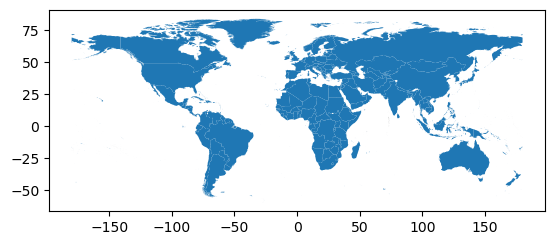

In [256]:
df_geo.plot()

In [396]:
import geopandas as gpd
# Grab low resolution world file
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
world = world.set_index("iso_a3")

world.head()

AttributeError: The geopandas.dataset has been deprecated and was removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.

## Folium Mapping

In [401]:
df_regions

,code,name,members,member_count
0,AFE,Africa Eastern and Southern,"ETH,BDI,SOM,COM,ZWE,NAM,SWZ,KEN,COD,MUS,MWI,BW...",26
1,AFR,Africa,"ETH,GIN,LBR,GAB,MLI,LBY,GHA,BDI,CMR,GNQ,NGA,SO...",54
2,AFW,Africa Western and Central,"GIN,LBR,GAB,MLI,GHA,CMR,NGA,GNQ,MRT,CAF,BEN,BF...",22
3,ARB,Arab World,"PSE,OMN,LBY,SOM,COM,MRT,JOR,SAU,SYR,TUN,QAT,DJ...",22
4,CAA,Sub-Saharan Africa (IFC classification),"ETH,GIN,LBR,GAB,MLI,GHA,BDI,CMR,GNQ,NGA,SOM,CO...",49
5,CEA,East Asia and the Pacific (IFC classification),"KIR,NCL,KOR,TLS,PLW,WSM,TUV,MAC,VUT,BRN,THA,FS...",33
6,CEB,Central Europe and the Baltics,"POL,LVA,EST,HUN,BGR,LTU,SVN,ROU,SVK,CZE,HRV",11
7,CEU,Europe and Central Asia (IFC classification),"LVA,HUN,ALB,KAZ,UKR,KGZ,MDA,TJK,MNE,EST,MLT,TU...",31
8,CLA,Latin America and the Caribbean (IFC classific...,"URY,KNA,LCA,DOM,COL,PER,CHL,SLV,HND,BRA,PRI,ME...",39
9,CME,Middle East and North Africa (IFC classification),"PSE,OMN,LBY,JOR,SYR,SAU,TUN,PAK,QAT,LBN,DZA,KW...",20


In [398]:
selected_region='SST'
members=df_regions[df_regions["code"]==selected_region]['members'].values[0]
members=members.split(',')
print(len(members))
members

40


['CYP',
 'KIR',
 'KNA',
 'STP',
 'TLS',
 'LCA',
 'NRU',
 'COM',
 'PLW',
 'WSM',
 'ISL',
 'TUV',
 'VUT',
 'SMR',
 'BRN',
 'MNE',
 'FSM',
 'SWZ',
 'EST',
 'BTN',
 'MLT',
 'MUS',
 'SUR',
 'VCT',
 'BRB',
 'MDV',
 'TON',
 'ATG',
 'GUY',
 'DJI',
 'CPV',
 'DMA',
 'GRD',
 'FJI',
 'MHL',
 'SYC',
 'BLZ',
 'SLB',
 'BHS',
 'BHR']

In [399]:
df_geo['selected_region']=None
df_geo.loc[df_geo['WB_A3'].isin(members),'selected_region']=1
# df_geo_region=df_geo[df_geo['WB_A3'].isin(members)]
# df_geo_region.shape

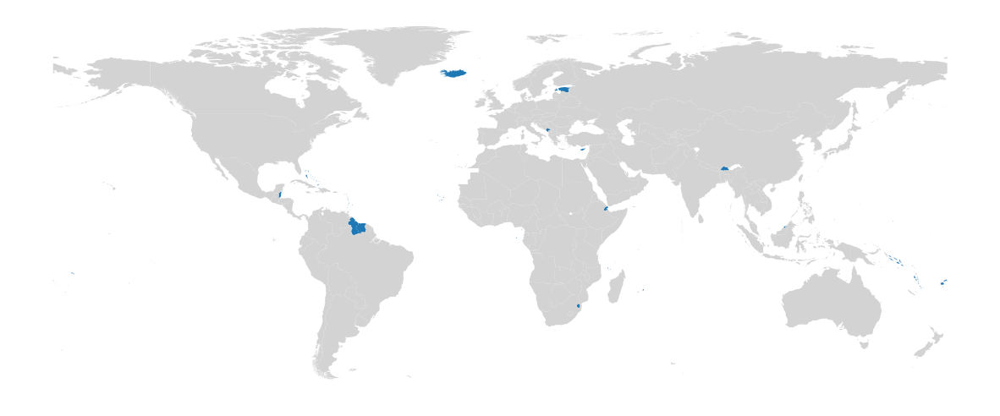

In [400]:
ax=df_geo.plot(column='selected_region',figsize=(15, 10),missing_kwds={'color': 'lightgrey'})
ax.set_axis_off();

In [404]:
import requests
import folium

m = folium.Map(tiles="cartodbpositron")

geojson_data = requests.get(
    "https://raw.githubusercontent.com/python-visualization/folium-example-data/main/world_countries.json"
).json()

folium.GeoJson(geojson_data, name="hello world").add_to(m)

folium.LayerControl().add_to(m)

m

In [405]:
geojson_data

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'name': 'Afghanistan'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[61.210817, 35.650072],
      [62.230651, 35.270664],
      [62.984662, 35.404041],
      [63.193538, 35.857166],
      [63.982896, 36.007957],
      [64.546479, 36.312073],
      [64.746105, 37.111818],
      [65.588948, 37.305217],
      [65.745631, 37.661164],
      [66.217385, 37.39379],
      [66.518607, 37.362784],
      [67.075782, 37.356144],
      [67.83, 37.144994],
      [68.135562, 37.023115],
      [68.859446, 37.344336],
      [69.196273, 37.151144],
      [69.518785, 37.608997],
      [70.116578, 37.588223],
      [70.270574, 37.735165],
      [70.376304, 38.138396],
      [70.806821, 38.486282],
      [71.348131, 38.258905],
      [71.239404, 37.953265],
      [71.541918, 37.905774],
      [71.448693, 37.065645],
      [71.844638, 36.738171],
      [72.193041, 36.948288],
      [72.63689, 37.047558],
      [73.

In [406]:
import pandas

state_geo = requests.get(
    "https://raw.githubusercontent.com/python-visualization/folium-example-data/main/us_states.json"
).json()
state_data = pandas.read_csv(
    "https://raw.githubusercontent.com/python-visualization/folium-example-data/main/us_unemployment_oct_2012.csv"
)

m = folium.Map(location=[48, -102], zoom_start=3)

folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=state_data,
    columns=["State", "Unemployment"],
    key_on="feature.id",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Unemployment Rate (%)",
).add_to(m)

folium.LayerControl().add_to(m)

m

In [407]:
state_data

,State,Unemployment
0,AL,7.1
1,AK,6.8
2,AZ,8.1
3,AR,7.2
4,CA,10.1
5,CO,7.7
6,CT,8.4
7,DE,7.1
8,FL,8.2
9,GA,8.8


In [408]:
state_geo

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'id': 'AL',
   'properties': {'name': 'Alabama'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-87.359296, 35.00118],
      [-85.606675, 34.984749],
      [-85.431413, 34.124869],
      [-85.184951, 32.859696],
      [-85.069935, 32.580372],
      [-84.960397, 32.421541],
      [-85.004212, 32.322956],
      [-84.889196, 32.262709],
      [-85.058981, 32.13674],
      [-85.053504, 32.01077],
      [-85.141136, 31.840985],
      [-85.042551, 31.539753],
      [-85.113751, 31.27686],
      [-85.004212, 31.003013],
      [-85.497137, 30.997536],
      [-87.600282, 30.997536],
      [-87.633143, 30.86609],
      [-87.408589, 30.674397],
      [-87.446927, 30.510088],
      [-87.37025, 30.427934],
      [-87.518128, 30.280057],
      [-87.655051, 30.247195],
      [-87.90699, 30.411504],
      [-87.934375, 30.657966],
      [-88.011052, 30.685351],
      [-88.10416, 30.499135],
      [-88.137022, 30.318396],
    

In [420]:
years

['1960',
 '1961',
 '1962',
 '1963',
 '1964',
 '1965',
 '1966',
 '1967',
 '1968',
 '1969',
 '1970',
 '1971',
 '1972',
 '1973',
 '1974',
 '1975',
 '1976',
 '1977',
 '1978',
 '1979',
 '1980',
 '1981',
 '1982',
 '1983',
 '1984',
 '1985',
 '1986',
 '1987',
 '1988',
 '1989',
 '1990',
 '1991',
 '1992',
 '1993',
 '1994',
 '1995',
 '1996',
 '1997',
 '1998',
 '1999',
 '2000',
 '2001',
 '2002',
 '2003',
 '2004',
 '2005',
 '2006',
 '2007',
 '2008',
 '2009',
 '2010',
 '2011',
 '2012',
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2018',
 '2019',
 '2020',
 '2021',
 '2022']

In [419]:
df_wld=df_tmp[df_tmp['year']=='2021']
print(df_wld.shape)
df_wld

(217, 7)


Series,region,economy,Country,year,GDP per capita (current US$),"Life expectancy at birth, total (years)","Population, total"
61,East Asia & Pacific,ASM,American Samoa,2021,16653.713778,NaN,4.503500e+04
123,East Asia & Pacific,AUS,Australia,2021,60697.245436,83.300,2.568541e+07
185,East Asia & Pacific,BRN,Brunei Darussalam,2021,31448.912748,74.642,4.453730e+05
247,East Asia & Pacific,CHN,China,2021,12617.505104,78.211,1.412360e+09
309,East Asia & Pacific,FJI,Fiji,2021,4656.051362,67.114,9.246100e+05
...,...,...,...,...,...,...,...
13205,Sub-Saharan Africa,TZA,Tanzania,2021,1146.031982,66.201,6.358833e+07
13267,Sub-Saharan Africa,UGA,Uganda,2021,883.892026,62.705,4.585378e+07
13329,Sub-Saharan Africa,ZAF,South Africa,2021,7073.612754,62.341,5.939226e+07
13391,Sub-Saharan Africa,ZMB,Zambia,2021,1134.713454,61.223,1.947312e+07


In [424]:
m = folium.Map(location=[48, -102], zoom_start=1)

folium.Choropleth(
    geo_data=geojson_data,
    name="choropleth",
    data=df_wld,
    columns=["economy", "Population, total"],
    key_on="feature.id",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Income Level",
).add_to(m)

folium.LayerControl().add_to(m)

m

#### Globe plot

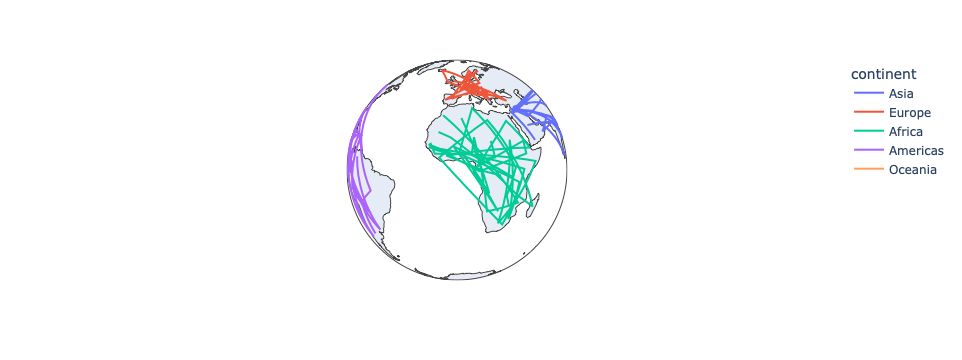

In [1]:
import plotly.express as px
df = px.data.gapminder().query("year == 2007")
fig = px.line_geo(df, locations="iso_alpha",
                  color="continent", # "continent" is one of the columns of gapminder
                  projection="orthographic")
fig.show()

In [2]:
ip_json={'status': 'success',
 'country': 'Brazil',
 'countryCode': 'BR',
 'region': 'MG',
 'regionName': 'Minas Gerais',
 'city': 'Jacutinga',
 'zip': '37590',
 'lat': -22.2974,
 'lon': -46.6062,
 'timezone': 'America/Sao_Paulo',
 'isp': 'Hardonline Ltda',
 'org': 'Hardonline Ltda',
 'as': 'AS28229 HARDONLINE LTDA',
 'query': '189.127.242.149'}

In [3]:
latitude = ip_json['lat']
longitude = ip_json['lon']

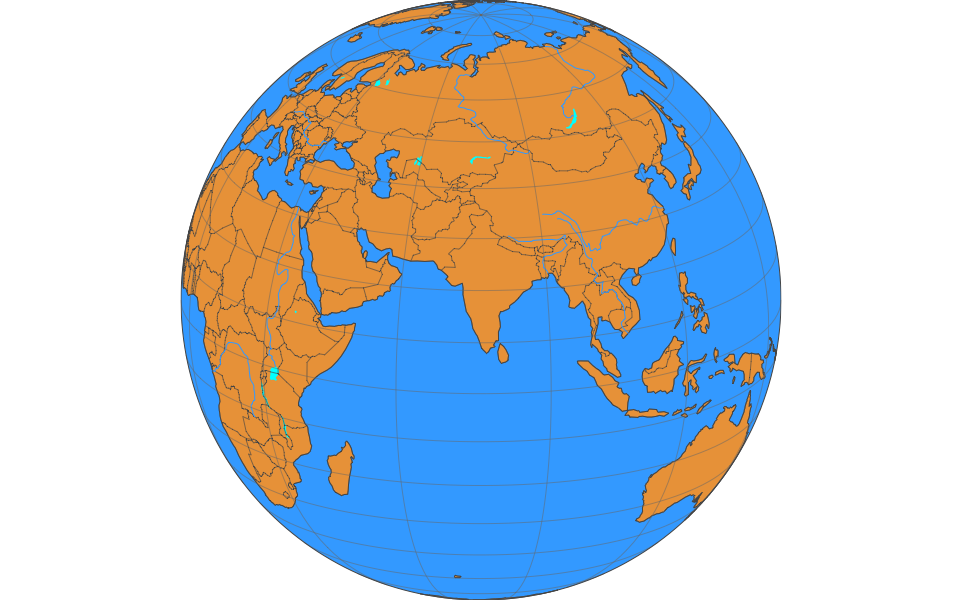

In [8]:
import plotly.graph_objects as go

#making the plot
fig = go.Figure(go.Scattergeo(lat=[latitude], lon=[longitude])) #if you are passing just one lat and lon, put it within "[]""

#editing the marker
fig.update_traces(marker_size=20, line=dict(color='Red'))

# this projection_type = 'orthographic is the projection which return 3d globe map'
# fig.update_geos(projection_type="natural earth2") 

#layout, exporting html and showing the plot
fig.update_layout(width= 600, height=600, margin={"r":0,"t":0,"l":0,"b":0},
                 geo = dict(
                        showland = True,
                        showcoastlines=True,
                        showcountries = True,
                        showrivers=True,
                        # showframe=True,
                        showocean = True,
                        countrywidth = 0.5,
                        landcolor = 'rgb(230, 145, 56)',
                        lakecolor = 'rgb(0, 255, 255)',
                        oceancolor = '#3399FF',#'rgb(0, 255, 255)',
                        projection = dict(
                            type = 'orthographic',
                            rotation = dict(
                                lon = -100,
                                lat = 40,
                                roll = 0
                            )
                        ),
                        lonaxis = dict(
                            showgrid = True,
                            gridcolor = 'rgb(102, 102, 102)',
                            gridwidth = 0.5
                        ),
                        lataxis = dict(
                            showgrid = True,
                            gridcolor = 'rgb(102, 102, 102)',
                            gridwidth = 0.5
                        )
                    )
            )
# fig.write_html("3d_plot.html")
fig.show()